In [1]:
#Data Wrangling
import pandas as pd
import numpy as np
from sklearn.preprocessing import normalize
from scipy.signal import find_peaks
from collections import defaultdict
import warnings
from collections import Counter
import itertools
from statistics import mode
from pandas_profiling import ProfileReport
from scipy import stats

#Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
from IPython.display import display
from cycler import cycler
from beakerx.object import beakerx
import cimcb_lite as cb

beakerx.pandas_display_table()

%matplotlib inline
py.init_notebook_mode(connected=True)

#Data Preprocessing
import scipy
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from mlens.preprocessing import Subset
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import MaxAbsScaler
from scipy.signal import wiener


#Machine Learning
from pandas.plotting import scatter_matrix
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import StratifiedKFold

from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.cluster import KMeans

from mlens.ensemble import Subsemble
from mlens.ensemble import SuperLearner


#Machine Learning Metrics
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import permutation_test_score
from sklearn.metrics import classification_report
#from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import cross_validate
from sklearn.metrics import accuracy_score, auc, average_precision_score, confusion_matrix, roc_curve, precision_recall_curve
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_recall_fscore_support as score
from mlens.metrics import make_scorer
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import make_scorer

import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_rows', None)

BeakerxHTML(value='You need beakerx_tabledisplay to use this')

[MLENS] backend: threading


# Set Random State for Reproducability


In [2]:
seed = 10
np.random.seed(seed)
rng = np.random.RandomState(seed=10)

# Serum Raman Spectra 

In [3]:
spectra = pd.read_csv("/Users/davidchen/Documents/GitHub/Serum_Raman_Spectroscopy_COVID_19/Reference_Dataset/covid_and_healthy_spectra.csv")

In [4]:
spectra.describe()

,400,402,405,407,410,412,415,417,420,422,...,2100,2101,2103,2104,2105,2107,2108,2109,2111,2112
count,309.0,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000,...,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000,309.000000,3.090000e+02
mean,0.0,-0.015380,-0.029039,-0.034453,-0.034902,-0.032640,-0.029887,-0.029552,-0.030194,-0.029093,...,-0.001951,-0.000781,0.000078,0.000814,0.001197,0.001420,0.001327,0.000953,0.000617,1.437182e-19
std,0.0,0.004866,0.009268,0.012563,0.014003,0.014396,0.014464,0.014713,0.015658,0.016331,...,0.000880,0.000853,0.000893,0.000901,0.000929,0.000931,0.000844,0.000820,0.000701,2.997270e-18
min,0.0,-0.034126,-0.060028,-0.074953,-0.078206,-0.080790,-0.078527,-0.078364,-0.082074,-0.083183,...,-0.004929,-0.004929,-0.004931,-0.005235,-0.005087,-0.005610,-0.003002,-0.001769,-0.001797,-1.110223e-17
25%,0.0,-0.018181,-0.034307,-0.041575,-0.042218,-0.039065,-0.035558,-0.035993,-0.038297,-0.037123,...,-0.002476,-0.001307,-0.000415,0.000345,0.000721,0.000960,0.000858,0.000472,0.000217,0.000000e+00
50%,0.0,-0.014863,-0.028215,-0.033517,-0.033892,-0.030718,-0.028413,-0.027639,-0.028696,-0.027925,...,-0.001989,-0.000714,0.000110,0.000799,0.001217,0.001439,0.001391,0.001023,0.000665,0.000000e+00
75%,0.0,-0.012075,-0.022868,-0.025739,-0.025721,-0.023546,-0.020764,-0.020656,-0.020443,-0.018591,...,-0.001447,-0.000292,0.000583,0.001288,0.001754,0.001949,0.001818,0.001466,0.001109,0.000000e+00
max,0.0,-0.002219,-0.006413,-0.006682,-0.004706,0.000129,0.005030,0.008210,0.010452,0.010410,...,0.002100,0.003037,0.003548,0.003594,0.004018,0.003570,0.003849,0.003291,0.002451,2.220446e-17


# Data Profile of Spectra

In [ ]:
profile = ProfileReport(spectra, title='Spectra Profiling Report', explorative=True, minimal=True)

In [ ]:
profile.to_file("/Users/davidchen/Documents/GitHub/Erevna/Spectra_Profile.html")

# Control Raman Spectra

In [5]:
tube = pd.read_csv("/Users/davidchen/Documents/GitHub/Serum_Raman_Spectroscopy_COVID_19/Reference_Dataset/tube_spectra.csv")

In [6]:
tube.describe()

,400,402,405,407,410,412,415,417,420,422,...,2100,2101,2103,2104,2105,2107,2108,2109,2111,2112
count,12.0,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,...,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.000000,12.0
mean,0.0,-0.037709,-0.081640,-0.102756,-0.108572,-0.107403,-0.100309,-0.109267,-0.125861,-0.132055,...,-0.001301,0.000279,0.001117,0.001489,0.001723,0.001747,0.001924,0.001848,0.001445,0.0
std,0.0,0.008066,0.014805,0.024838,0.032322,0.046524,0.067408,0.043346,0.023751,0.029965,...,0.001123,0.001282,0.001159,0.001004,0.000949,0.001068,0.001138,0.001000,0.001148,0.0
min,0.0,-0.049705,-0.097063,-0.126480,-0.139408,-0.148649,-0.150611,-0.150052,-0.148668,-0.189510,...,-0.003574,-0.001736,-0.001683,-0.000005,0.000366,0.000084,-0.000132,-0.000684,-0.000404,0.0
25%,0.0,-0.042961,-0.092629,-0.120232,-0.130501,-0.134348,-0.129605,-0.133104,-0.139797,-0.143622,...,-0.001914,-0.000511,0.000769,0.000700,0.000922,0.001106,0.001195,0.001623,0.000894,0.0
50%,0.0,-0.039632,-0.085782,-0.111555,-0.120875,-0.123704,-0.121573,-0.124000,-0.136210,-0.136877,...,-0.001114,0.000222,0.001128,0.001626,0.001747,0.001673,0.001924,0.001801,0.001042,0.0
75%,0.0,-0.034523,-0.073057,-0.094485,-0.102390,-0.105849,-0.104855,-0.103826,-0.123390,-0.128459,...,-0.000788,0.001312,0.001510,0.002059,0.002463,0.002243,0.002625,0.002442,0.002223,0.0
max,0.0,-0.023086,-0.048723,-0.046363,-0.042852,0.019045,0.102823,0.010225,-0.069188,-0.068148,...,0.000587,0.002547,0.003317,0.003526,0.003250,0.003816,0.003934,0.003413,0.003894,0.0


# Data Preprocessing 

In [7]:
def baseline(spectra):
    return spectra.iloc[:, :-1] - tube.mean(axis=0)

In [8]:
normalized_spectra = baseline(spectra)

In [9]:
def outlier_drop(normalized_spectra):

    Q1 = normalized_spectra.quantile(0.25)
    Q3 = normalized_spectra.quantile(0.75)
    IQR = Q3 - Q1
    idx = ~((normalized_spectra < (Q1 - 3 * IQR)) | (normalized_spectra > (Q3 + 3 * IQR))).any(axis=1)
    
    return normalized_spectra.loc[idx]


In [10]:
clean_spectra = outlier_drop(normalized_spectra)

In [11]:
clean_spectra_index = clean_spectra.index

In [12]:
def weiner_filter(clean_spectra):
    return scipy.signal.wiener(clean_spectra)

In [13]:
filter_spectra = weiner_filter(clean_spectra)

In [14]:
def feature_select(filter_spectra, n_features):
    forest = ExtraTreesClassifier(n_estimators=250,
                              random_state=rng)

    forest.fit(filter_spectra, spectra.loc[clean_spectra.index, "diagnostic"])
    importances = forest.feature_importances_
    std = np.std([tree.feature_importances_ for tree in forest.estimators_],
                 axis=0)
    indices = np.argsort(importances)[::-1]
    
    return filter_spectra[:, indices[:n_features]]

In [15]:
select_spectra = feature_select(filter_spectra, n_features=100)

In [16]:
scaler_dict = {'none': None,
                    'sc': StandardScaler(),
                    'sub': Subset([0, 1]),
                    'minmax': MinMaxScaler(),
                    'maxabs': MaxAbsScaler()
                    }

In [17]:
def standard_scaling(scaler, select_spectra):
    if scaler == None:
        return select_spectra
    else:
        return scaler.fit_transform(select_spectra)

In [18]:
scaled_spectra = standard_scaling(scaler = scaler_dict['sc'], select_spectra = select_spectra)

In [19]:
def pca_reduce(scaled_spectra, explained_variance):

    for n in range(1, min(scaled_spectra.shape), 1):
        pca_components = PCA(n_components=n)
        pca_transform = pca_components.fit_transform(scaled_spectra)
        if sum(pca_components.explained_variance_ratio_) < explained_variance:
            pass
        else:
            pca_components_final = PCA(n_components=n)
            pca_transform = pca_components_final.fit_transform(scaled_spectra)
            pca_df = pd.DataFrame(data = pca_transform, index = clean_spectra_index, columns = ["pc_" + str(x) for x in range(1, n+1)])
            break
    return pca_df  

In [20]:
processed_spectra = pca_reduce(scaled_spectra, 0.99)

In [21]:
X = processed_spectra.sample(frac=1, random_state=10)
y = spectra.loc[X.index, "diagnostic"]

In [22]:
def preprocessing(spectra, n_features, explained_variance, scaler):
    normalized_spectra = baseline(spectra)
    clean_spectra = outlier_drop(normalized_spectra)
    clean_spectra_index = clean_spectra.index
    filter_spectra = weiner_filter(clean_spectra)
    select_spectra = feature_select(filter_spectra, n_features=n_features)
    scaled_spectra = standard_scaling(scaler, select_spectra)
    processed_spectra = pca_reduce(scaled_spectra, explained_variance)
    return processed_spectra

# Test for Ideal Number of Selected Features, Scaling Method and Minimum Explained Variance of Principal Components

In [1155]:
def features_benchmark(model, spectra, n_features):
    feat_benchmark = pd.DataFrame()
    for i in range(10, n_features, 10):
        df = preprocessing(spectra=spectra, n_features=i, explained_variance=0.99, scaler=scaler_dict['sc'])
        feat_benchmark[i] = cross_val_score(model, df.values, np.array([0 if label == "Healthy" else 1 for label in y]), cv=StratifiedKFold(n_splits=10, random_state=10), scoring="accuracy")
    return feat_benchmark

In [1175]:
def scale_benchmark(model, spectra, scaler_dict):
    scale_benchmark = pd.DataFrame()
    for i in list(scaler_dict.keys()):
        df = preprocessing(spectra=spectra, scaler = scaler_dict[i] , n_features = 100, explained_variance=0.99)
        scale_benchmark[i] = cross_val_score(model, df.values, np.array([0 if label == "Healthy" else 1 for label in y]), cv=StratifiedKFold(n_splits=10, random_state=10), scoring="accuracy")
    return scale_benchmark
    

In [1161]:
def variance_benchmark(model, spectra, explained_variance):
    var_benchmark = pd.DataFrame()
    for i in range(90, explained_variance):
        df = preprocessing(spectra=spectra, explained_variance=i/100, n_features=100, scaler=scaler_dict['sc'])
        var_benchmark[i] = cross_val_score(model, df.values, np.array([0 if label == "Healthy" else 1 for label in y]), cv=StratifiedKFold(n_splits=10, random_state=10), scoring="accuracy")
    return var_benchmark
    

# Raman Spectra Distribution Plot

In [111]:
# Extra Trees Feature Importance
clf = ExtraTreesClassifier(n_estimators=250, random_state=seed)
clf.fit(spectra.iloc[:, :-1], spectra.iloc[:, -1])
feature_importance = clf.feature_importances_
# Make importances relative to max importance
feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)[::-1]
# Create dictionary mapping wavenumber:feature importance 
feat_importance_dict = {}
for x in range(len(spectra.columns[sorted_idx])):
    feat_importance_dict[spectra.columns[sorted_idx][x]] = feature_importance[sorted_idx][x]

#Healthy Raman Spectra 
healthy = spectra[spectra["diagnostic"] == "Healthy"].iloc[:, :-1]
healthy_mean = healthy.mean(axis=0)
healthy_5 = healthy.quantile(0.05)
healthy_95 = healthy.quantile(0.95)

#COVID-19 Raman Spectra 
sars_cov_2 = spectra[spectra["diagnostic"] == "SARS-CoV-2"].iloc[:, :-1]
sars_mean = sars_cov_2.mean(axis=0)
sars_5 = sars_cov_2.quantile(0.05)
sars_95 = sars_cov_2.quantile(0.95)

In [ ]:
ax.prop_cycle : (cycler('color', ['k', 'r', 'b', 'g']) + cycler('ls', ['-', '--', ':', '-.']))

# Set default figure size
figure.figsize : 3.3, 2.5
figure.dpi : 600

# Font sizes
font.size : 8
font.family : serif
font.serif : Times
    
plt.rcParams.update({'font.size': 8, 'font.family' : serif, 'font.serif' : Times, 'figure.dpi' : 600})
ax.set_prop_cycle : (cycler('color', ['k', 'r', 'b', 'g']) + cycler('ls', ['-', '--', ':', '-.']))

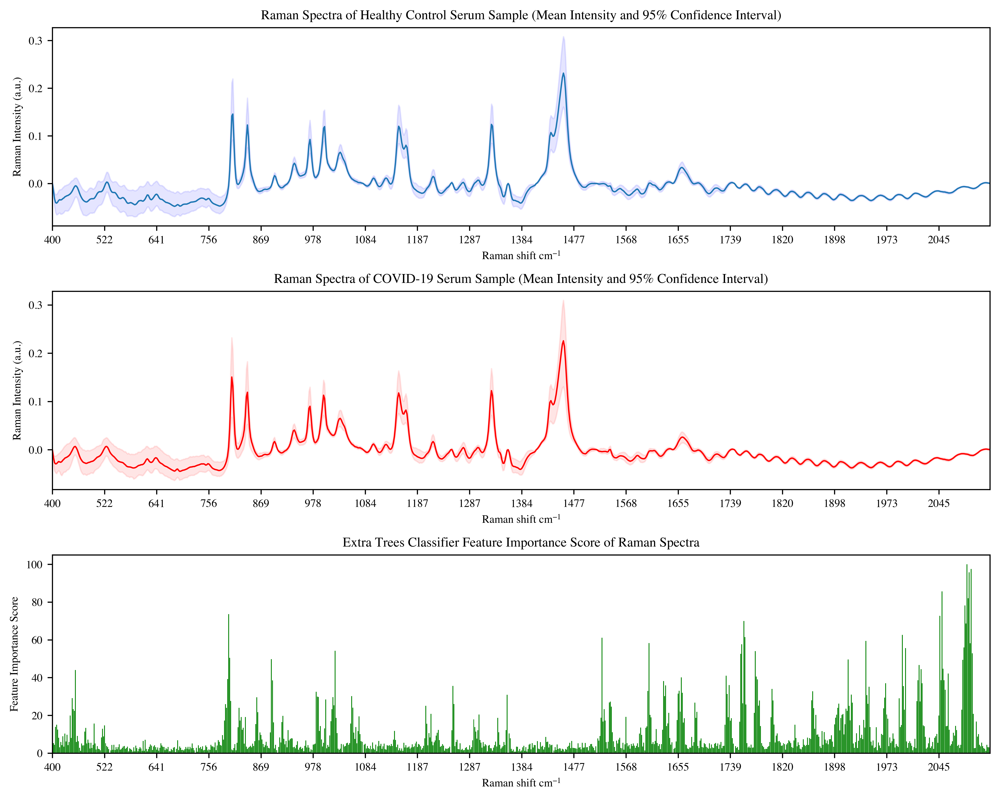

In [228]:
#Spectra Plot of Mean and 95% CI with Feature Importance Overlay
fig, ax = plt.subplots(3, figsize=(10, 8))

x_bar = spectra.columns[:-1]
y_bar = [feat_importance_dict[x] for x in spectra.columns[:-1]]

ax[2].bar(x_bar, y_bar, color="g")
ax[2].set_xlim("400", "2112")
ax[2].set_xticks(list(healthy.columns)[::50])
ax[2].set_ylabel("Feature Importance Score")
ax[2].set_xlabel("Raman shift $cm^{-1}$")
ax[2].set_title('Extra Trees Classifier Feature Importance Score of Raman Spectra' )

ax[1].plot(sars_mean, linewidth=1, color="r", ls='-') #mean curve.
ax[1].fill_between(list(sars_cov_2.columns), sars_5, sars_95, color='r', alpha=.1) #std curves.
ax[1].set_title("Raman Spectra of COVID-19 Serum Sample (Mean Intensity and 95% Confidence Interval)")
ax[1].set_xlabel("Raman shift $cm^{-1}$")
ax[1].set_ylabel("Raman Intensity (a.u.)")
ax[1].set_xlim("400", "2112")
ax[1].set_xticks(list(sars_cov_2.columns)[::50])

ax[0].plot(healthy_mean, linewidth=1, ls='-') #mean curve.
ax[0].fill_between(list(healthy.columns), healthy_5, healthy_95, color='b', alpha=.1) #std curves.
ax[0].set_title("Raman Spectra of Healthy Control Serum Sample (Mean Intensity and 95% Confidence Interval)")
ax[0].set_xlabel("Raman shift $cm^{-1}$")
ax[0].set_ylabel("Raman Intensity (a.u.)")
ax[0].set_xlim("400", "2112")
ax[0].set_xticks(list(healthy.columns)[::50])

fig.tight_layout()
plt.rcParams.update({'mathtext.default':  'regular' })
plt.rcParams['font.size'] = 8
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = "Times"
plt.rcParams["figure.dpi"] = 600

plt.show()

In [1576]:
healthy_mean.nlargest(20) 

1459    0.231654
1461    0.223186
1457    0.222207
1455    0.205581
1463    0.195716
1453    0.187477
1451    0.169452
1464    0.158400
1450    0.150868
808     0.145721
806     0.141573
1448    0.133136
1328    0.124043
840     0.122794
1466    0.121463
1330    0.120193
1150    0.120102
1001    0.119449
1446    0.117969
1152    0.116199
dtype: float64

# Boxplots to Compare Difference in Distribution of Raman Intensity

In [1578]:
(healthy_mean - sars_mean).nlargest(20)0.

810     0.016614
842     0.013952
1001    0.013658
808     0.013493
1004    0.011426
1463    0.011334
1464    0.011153
1466    0.009464
1461    0.009410
1332    0.008990
1659    0.008471
1660    0.008141
1330    0.007924
1657    0.007865
1468    0.007746
844     0.007669
813     0.007646
1662    0.007245
1334    0.007007
1438    0.006692
dtype: float64

In [248]:
(healthy_mean - sars_mean).nsmallest(20) 

804   -0.023261
801   -0.017976
449   -0.014618
447   -0.014530
444   -0.013833
452   -0.013555
412   -0.012648
837   -0.012560
442   -0.012501
835   -0.012396
410   -0.012380
454   -0.011538
439   -0.011529
437   -0.011128
415   -0.011002
429   -0.010588
407   -0.010572
481   -0.010526
427   -0.010513
432   -0.010481
dtype: float64

In [166]:
stats.ttest_ind(spectra['810'][:150], spectra['810'][150:])

Ttest_indResult(statistic=5.004150751537268, pvalue=9.466648571805468e-07)

In [167]:
stats.ttest_ind(spectra['842'][:150], spectra['842'][150:])

Ttest_indResult(statistic=4.498504330692474, pvalue=9.719430324859594e-06)

In [168]:
stats.ttest_ind(spectra['1001'][:150], spectra['1001'][150:])

Ttest_indResult(statistic=6.069633894160346, pvalue=3.775397682109866e-09)

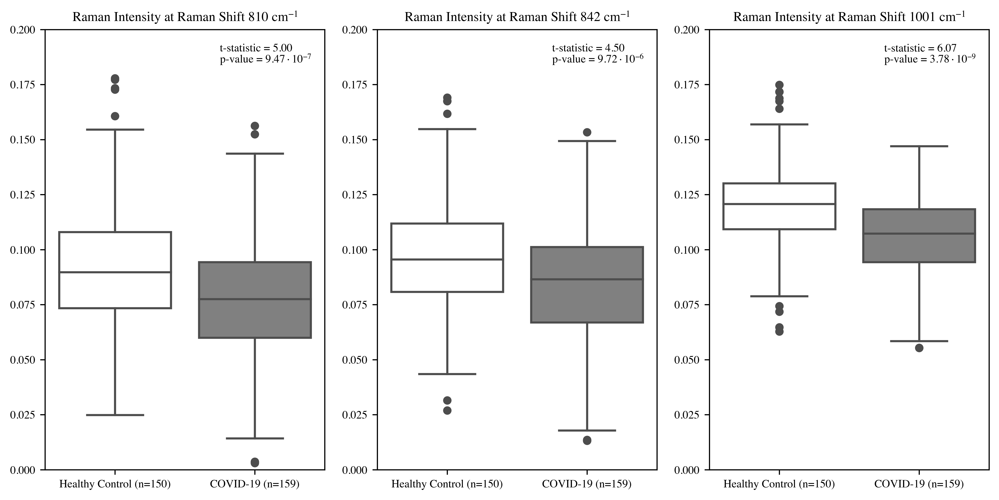

In [236]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(10, 5))

flierprops = dict(marker='o', markersize=5)
ax1 = sns.boxplot(data=[spectra['810'][:150], spectra['810'][150:]],palette=["white", "grey"], ax=ax1, flierprops=flierprops)
ax1.set(xticklabels=['Healthy Control (n=150)', 'COVID-19 (n=159)'])
ax1.text(x=0.75, y=0.19, s='t-statistic = 5.00')
ax1.text(x=0.75, y=0.185, s='p-value = $ 9.47 \cdot 10^{-7}$')
ax1.set_ylim(0, 0.2)
ax1.set_title("Raman Intensity at Raman Shift 810 $cm^{-1}$")

ax2 = sns.boxplot(data=[spectra['842'][:150], spectra['842'][150:]],palette=["white", "grey"], ax=ax2,flierprops=flierprops)
ax2.set(xticklabels=['Healthy Control (n=150)', 'COVID-19 (n=159)'])
ax2.text(x=0.75, y=0.19, s='t-statistic = 4.50')
ax2.text(x=0.75, y=0.185, s='p-value = $ 9.72 \cdot 10^{-6}$')
ax2.set_ylim(0, 0.2)
ax2.set_title("Raman Intensity at Raman Shift 842 $cm^{-1}$")

ax3 = sns.boxplot(data=[spectra['1001'][:150], spectra['1001'][150:]],palette=["white", "grey"], ax=ax3,flierprops=flierprops)
ax3.set(xticklabels=['Healthy Control (n=150)', 'COVID-19 (n=159)'])
ax3.text(x=0.75, y=0.19, s='t-statistic = 6.07')
ax3.text(x=0.75, y=0.185, s='p-value = $ 3.78 \cdot 10^{-9}$')
ax3.set_ylim(0, 0.2)
ax3.set_title("Raman Intensity at Raman Shift 1001 $cm^{-1}$")

fig.tight_layout()
plt.rcParams.update({'mathtext.default':  'regular' })
plt.rcParams['font.size'] = 8
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = "Times"
plt.rcParams["figure.dpi"] = 600

plt.show()

# Principal Component Analysis

In [335]:
#Before Feature Engineering and Selection
cb.plot.pca(spectra.iloc[:, :-1],
            pcx=1,                                                  # pc for x-axis
            pcy=2,                                                  # pc for y-axis
            group_label=spectra.iloc[:, -1])

Loading BokehJS ...

In [1261]:
#After Feature Engineering and Selection
cb.plot.pca(X,
            pcx=1,                                                  # pc for x-axis
            pcy=2,                                                  # pc for y-axis
            group_label=y)

Loading BokehJS ...

In [1584]:
cb.plot.pca(spectra.iloc[:, :-1],
            pcx=1,                                                  # pc for x-axis
            pcy=2,                                                  # pc for y-axis
            group_label=spectra.iloc[:, -1]) 
plt.savefig("/Users/davidchen/Documents/GitHub/Erevna/pre_pca.png")

Loading BokehJS ...

<Figure size 3600x2400 with 0 Axes>

# Grid Search of Hyperparameters for Optimal Independent Model Performance

In [143]:
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [144]:
class GridSearch(object):
    
    def __init__(self,X_train,y_train,model,hyperparameters):
        
        self.X_train = X_train
        self.y_train = y_train
        self.model = model
        self.hyperparameters = hyperparameters
        
    def GridSearch(self):
        # Create randomized search 10-fold cross validation and 100 iterations
        cv = 10
        clf = GridSearchCV(self.model,
                                 self.hyperparameters,
                                 cv=cv,
                                 verbose=0,
                                 n_jobs=-1,
                                 )
        # Fit randomized search
        best_model = clf.fit(self.X_train, self.y_train)
        message = (best_model.best_score_, best_model.best_params_)
        print("Best: %f using %s" % (message))

        return best_model,best_model.best_params_
    
    def BestModelPredict(self,X_test):
        
        best_model,_ = self.GridSearch()
        pred = best_model.predict(X_test)
        
        return pred

In [145]:
#Grid Search Parameter Pool
knn_pars = {'n_neighbors': [2,4,6,8,10,12,14,16,18,20], 'weights': ['uniform', 'distance']}
lr_pars = {'C': [0.5, 1, 1.5, 2, 3, 5], 'penalty': ['l1', 'l2', 'elasticnet', 'none']}
svc_pars = {'C': [0.5, 1, 1.5, 2, 3, 5], 'kernel': [ 'linear' , 'poly' , 'rbf' , 'sigmoid'], 'degree': [1,2,3,4,5]}
dt_pars = {'criterion': ['gini', 'entropy'], 'min_samples_split': [1,2,3,4,5], 'min_samples_leaf': [1,2,3,4,5] }
ab_pars = {'learning_rate': [.01,.05,.1,.5,1], 'n_estimators': [50,100,150,200]}
gb_pars = {'learning_rate': [.01,.05,.1,.5,1], 'n_estimators': [50,100,150,200]}
rf_pars = {'criterion': ['gini', 'entropy'], 'n_estimators':[50,100,150,200] , 'max_depth':[5, 10, 20] , 'min_samples_split': [10, 20, 50] , 'min_samples_leaf': [3, 5, 10] }
et_pars = {'criterion': ['gini', 'entropy'], 'n_estimators':[50,100,150,200] , 'max_depth':[5, 10, 20] , 'min_samples_split': [10, 20, 50] , 'min_samples_leaf': [3, 5, 10] }
mlp_pars= {
    'hidden_layer_sizes': [(50,50,50), (50,100,50), (100,)],
    'activation': ['tanh', 'relu'],
    'solver': ['sgd'],
    'alpha': [0.001, 0.005, 0.01],
    'learning_rate': ['constant','adaptive'],
    'early_stopping': [True]
}

In [957]:
ests = [('knn', KNeighborsClassifier()), ('lr', LogisticRegression()), 
        ('svc', SVC()), ('dt', DecisionTreeClassifier()), 
        ('ab', AdaBoostClassifier()), ('gb', GradientBoostingClassifier()), 
        ('rf', RandomForestClassifier()), ('et', ExtraTreesClassifier()), 
        ('mlp', MLPClassifier())]


In [359]:
LR_gs = GridSearch(X,y,LogisticRegression(),hyperparameters=lr_pars)
LR_gs.GridSearch()

Best: 0.968000 using {'C': 0.5, 'penalty': 'none'}


(GridSearchCV(cv=10, estimator=LogisticRegression(), n_jobs=1,
              param_grid={'C': [0.5, 1, 1.5, 2, 3, 5],
                          'penalty': ['l1', 'l2', 'elasticnet', 'none']}),
 {'C': 0.5, 'penalty': 'none'})

In [360]:
KNN_gs = GridSearch(X,y,KNeighborsClassifier(),hyperparameters=knn_pars)
KNN_gs.GridSearch()

Best: 0.960000 using {'n_neighbors': 2, 'weights': 'distance'}


(GridSearchCV(cv=10, estimator=KNeighborsClassifier(), n_jobs=1,
              param_grid={'n_neighbors': [2, 4, 6, 8, 10, 12, 14, 16, 18, 20],
                          'weights': ['uniform', 'distance']}),
 {'n_neighbors': 2, 'weights': 'distance'})

In [361]:
SV_gs = GridSearch(X,y,SVC(),hyperparameters=svc_pars)
SV_gs.GridSearch()

Best: 0.964000 using {'C': 1.5, 'degree': 1, 'kernel': 'linear'}


(GridSearchCV(cv=10, estimator=SVC(), n_jobs=1,
              param_grid={'C': [0.5, 1, 1.5, 2, 3, 5], 'degree': [1, 2, 3, 4, 5],
                          'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}),
 {'C': 1.5, 'degree': 1, 'kernel': 'linear'})

In [362]:
DT_gs = GridSearch(X,y,DecisionTreeClassifier(),hyperparameters=dt_pars)
DT_gs.GridSearch()

Best: 0.932000 using {'criterion': 'entropy', 'min_samples_leaf': 1, 'min_samples_split': 3}


(GridSearchCV(cv=10, estimator=DecisionTreeClassifier(), n_jobs=1,
              param_grid={'criterion': ['gini', 'entropy'],
                          'min_samples_leaf': [1, 2, 3, 4, 5],
                          'min_samples_split': [1, 2, 3, 4, 5]}),
 {'criterion': 'entropy', 'min_samples_leaf': 1, 'min_samples_split': 3})

In [363]:
AB_gs = GridSearch(X,y,AdaBoostClassifier(),hyperparameters=ab_pars)
AB_gs.GridSearch()

Best: 0.952000 using {'learning_rate': 1, 'n_estimators': 50}


(GridSearchCV(cv=10, estimator=AdaBoostClassifier(), n_jobs=1,
              param_grid={'learning_rate': [0.01, 0.05, 0.1, 0.5, 1],
                          'n_estimators': [50, 100, 150, 200]}),
 {'learning_rate': 1, 'n_estimators': 50})

In [364]:
GB_gs = GridSearch(X,y,GradientBoostingClassifier(),hyperparameters=gb_pars)
GB_gs.GridSearch()

Best: 0.952000 using {'learning_rate': 0.1, 'n_estimators': 150}


(GridSearchCV(cv=10, estimator=GradientBoostingClassifier(), n_jobs=1,
              param_grid={'learning_rate': [0.01, 0.05, 0.1, 0.5, 1],
                          'n_estimators': [50, 100, 150, 200]}),
 {'learning_rate': 0.1, 'n_estimators': 150})

In [365]:
RF_gs = GridSearch(X,y,RandomForestClassifier(),hyperparameters=rf_pars)
RF_gs.GridSearch()

Best: 0.960000 using {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 3, 'min_samples_split': 20, 'n_estimators': 150}


(GridSearchCV(cv=10, estimator=RandomForestClassifier(), n_jobs=1,
              param_grid={'criterion': ['gini', 'entropy'],
                          'max_depth': [5, 10, 20],
                          'min_samples_leaf': [3, 5, 10],
                          'min_samples_split': [10, 20, 50],
                          'n_estimators': [50, 100, 150, 200]}),
 {'criterion': 'gini',
  'max_depth': 5,
  'min_samples_leaf': 3,
  'min_samples_split': 20,
  'n_estimators': 150})

In [366]:
ET_gs = GridSearch(X,y,ExtraTreesClassifier(),hyperparameters=et_pars)
ET_gs.GridSearch()

Best: 0.968000 using {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 3, 'min_samples_split': 10, 'n_estimators': 200}


(GridSearchCV(cv=10, estimator=ExtraTreesClassifier(), n_jobs=1,
              param_grid={'criterion': ['gini', 'entropy'],
                          'max_depth': [5, 10, 20],
                          'min_samples_leaf': [3, 5, 10],
                          'min_samples_split': [10, 20, 50],
                          'n_estimators': [50, 100, 150, 200]}),
 {'criterion': 'gini',
  'max_depth': 5,
  'min_samples_leaf': 3,
  'min_samples_split': 10,
  'n_estimators': 200})

In [146]:
MLP_gs = GridSearch(X,y,MLPClassifier(),hyperparameters=mlp_pars)
MLP_gs.GridSearch()

Best: 0.948000 using {'activation': 'tanh', 'alpha': 0.005, 'early_stopping': True, 'hidden_layer_sizes': (100,), 'learning_rate': 'adaptive', 'solver': 'sgd'}


(GridSearchCV(cv=10, estimator=MLPClassifier(), n_jobs=-1,
              param_grid={'activation': ['tanh', 'relu'],
                          'alpha': [0.001, 0.005, 0.01],
                          'early_stopping': [True],
                          'hidden_layer_sizes': [(50, 50, 50), (50, 100, 50),
                                                 (100,)],
                          'learning_rate': ['constant', 'adaptive'],
                          'solver': ['sgd']}),
 {'activation': 'tanh',
  'alpha': 0.005,
  'early_stopping': True,
  'hidden_layer_sizes': (100,),
  'learning_rate': 'adaptive',
  'solver': 'sgd'})

# Model Metrics 

In [98]:
def metrics(clf):
    matthews = make_scorer(matthews_corrcoef, greater_is_better=True)
    cohen = make_scorer(cohen_kappa_score, greater_is_better=True)
    alt_score = {'matthews': matthews, 'cohen': cohen,
                'accuracy': 'accuracy', 'precision':'precision',
                'recall': 'recall', 'f1': 'f1', 'roc_auc': 'roc_auc'}
    scores = cross_validate(clf, X, [0 if label == "Healthy" else 1 for label in y], cv=StratifiedKFold(n_splits=10, random_state=10), scoring=alt_score)
    return pd.DataFrame(data=scores)

In [99]:
LR_metrics = metrics(LogisticRegression(C = 0.5, penalty = 'none'))

In [100]:
KNN_metrics = metrics(KNeighborsClassifier(n_neighbors= 2, weights= 'distance'))

In [151]:
SV_metrics = metrics(SVC(C= 1.5, degree= 1, kernel= 'linear', probability=True))

In [102]:
DT_metrics = metrics(DecisionTreeClassifier(criterion= 'entropy', min_samples_leaf= 1, min_samples_split= 3))

In [103]:
AB_metrics = metrics(AdaBoostClassifier(learning_rate= 1, n_estimators= 50))

In [104]:
GB_metrics = metrics(GradientBoostingClassifier(learning_rate= 0.1, n_estimators= 150))

In [105]:
RF_metrics = metrics(RandomForestClassifier(criterion= 'gini', max_depth= 5, min_samples_leaf= 3, min_samples_split= 20, n_estimators= 150))

In [106]:
ET_metrics = metrics(ExtraTreesClassifier(criterion= 'gini', max_depth= 5, min_samples_leaf= 3, min_samples_split= 10, n_estimators= 200))

In [140]:
MLP_metrics = metrics(MLPClassifier(activation= 'tanh', alpha= 0.005, hidden_layer_sizes= (50, 100, 50), learning_rate= 'constant', solver= 'sgd'))

In [141]:
MLP_metrics

,fit_time,score_time,test_matthews,test_cohen,test_accuracy,test_precision,test_recall,test_f1,test_roc_auc
0,0.363036,0.006302,0.849837,0.838710,0.92,1.000000,0.833333,0.909091,0.935897
1,0.342500,0.006212,0.923077,0.920128,0.96,0.923077,1.000000,0.960000,0.993590
2,0.342946,0.006971,1.000000,1.000000,1.00,1.000000,1.000000,1.000000,1.000000
3,0.358920,0.006278,1.000000,1.000000,1.00,1.000000,1.000000,1.000000,1.000000
4,0.361576,0.006184,0.923077,0.920128,0.96,1.000000,0.923077,0.960000,0.987179
5,0.366219,0.006395,1.000000,1.000000,1.00,1.000000,1.000000,1.000000,1.000000
6,0.371332,0.006314,0.923077,0.920128,0.96,1.000000,0.923077,0.960000,0.967949
7,0.370651,0.006191,0.851631,0.840764,0.92,1.000000,0.846154,0.916667,1.000000
8,0.377425,0.006340,0.851631,0.840764,0.92,1.000000,0.846154,0.916667,1.000000
9,0.368129,0.006615,0.923077,0.920128,0.96,1.000000,0.923077,0.960000,0.980769


In [142]:
MLP_metrics.mean(axis=0)

fit_time          0.362273
score_time        0.006380
test_matthews     0.924541
test_cohen        0.920075
test_accuracy     0.960000
test_precision    0.992308
test_recall       0.929487
test_f1           0.958242
test_roc_auc      0.986538
dtype: float64

In [108]:
def individual_metric(metric, model, model_name):
    model_performance = pd.DataFrame(columns = ['model', 'score'])
    model_performance['model'] = [model_name] * 10
    model_performance['score'] = model[metric]
    return model_performance

In [109]:
def group_metric(metric):
    total_model_performance = pd.DataFrame(columns = ['model', 'score'])
    for i,j in [(LR_metrics, "LR"), (KNN_metrics, "KNN"), 
                (SV_metrics, "SV"), (DT_metrics, "DT"),
                (AB_metrics, "AB"), (GB_metrics, "GB"),
                (RF_metrics, "RF"), (ET_metrics, "ET"),
                (MLP_metrics, "MLP")]:
    
        total_model_performance = total_model_performance.append(individual_metric(metric, model = i, model_name = j))
    return total_model_performance

In [147]:
matthews = group_metric(metric='test_matthews')
cohen = group_metric(metric='test_cohen')
accuracy = group_metric(metric='test_accuracy')
precision = group_metric(metric='test_precision')
recall = group_metric(metric='test_recall')
f1 = group_metric(metric='test_f1')
roc_auc = group_metric(metric='test_roc_auc')
time = pd.DataFrame(columns = ['score'], data= group_metric(metric='fit_time')['score'] + group_metric(metric='score_time')['score'])
time['model'] = roc_auc['model']

# Save trained models to file

In [118]:
import pickle

In [119]:
def model_save(model, model_file_name):
    model_saved = model
    model_saved.fit(X, np.array([0 if label == "Healthy" else 1 for label in y]))
    with open(model_file_name, 'wb') as file:
        pickle.dump(model, file)

In [1661]:
model_save(model = LogisticRegression(C = 0.5, penalty = 'none'), 
           model_file_name = "logistic_regression_model.pkl")

In [1663]:
model_save(model = KNeighborsClassifier(n_neighbors= 2, weights= 'distance'), 
           model_file_name = "k_nearest_neighbors_model.pkl")

In [1664]:
model_save(model = SVC(C= 1.5, degree= 1, kernel= 'linear', probability=True), 
           model_file_name = "support_vector_model.pkl")

In [1665]:
model_save(model = DecisionTreeClassifier(criterion= 'entropy', min_samples_leaf= 1, min_samples_split= 3), 
           model_file_name = "decision_tree_model.pkl")

In [1666]:
model_save(model = AdaBoostClassifier(learning_rate= 1, n_estimators= 50), 
           model_file_name = "adaboost_model.pkl")

In [1667]:
model_save(model = GradientBoostingClassifier(learning_rate= 0.1, n_estimators= 150), 
           model_file_name = "gradient_boost_model.pkl")

In [1669]:
model_save(model = RandomForestClassifier(criterion= 'gini', max_depth= 5, min_samples_leaf= 3, min_samples_split= 20, n_estimators= 150), 
           model_file_name = "random_forest_model.pkl")

In [1670]:
model_save(model = ExtraTreesClassifier(criterion= 'gini', max_depth= 5, min_samples_leaf= 3, min_samples_split= 10, n_estimators= 200), 
           model_file_name = "extra_trees_model.pkl")

In [120]:
model_save(model = MLPClassifier(activation= 'tanh', alpha= 0.005, hidden_layer_sizes= (50, 100, 50), learning_rate= 'constant', solver= 'adam', early_stopping=True), 
           model_file_name = "multi_layer_perceptron_model.pkl")

In [1675]:
model_save(model = sub, 
           model_file_name = "stacked_subsemble_model.pkl")

# Model Metrics Visualization

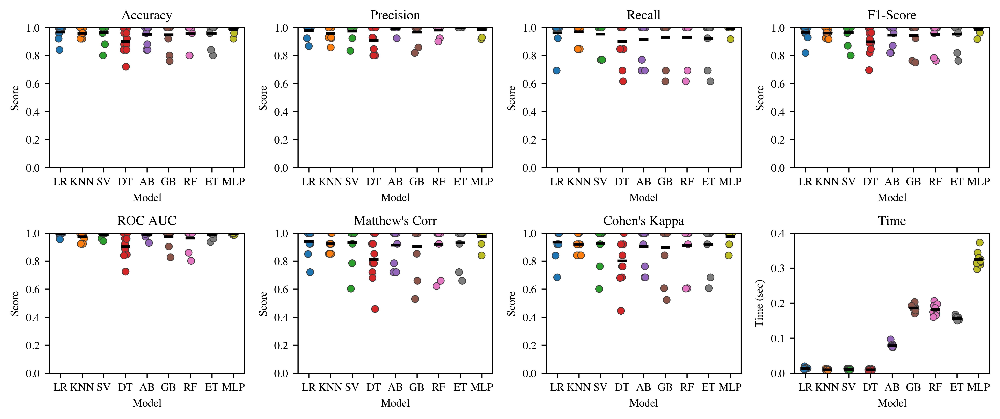

In [1041]:
plt.figure(0, figsize=(10,10))

ax2.set_prop_cycle(cycler('color', ['black', 'r', 'b', 'g']) + cycler('ls', ['-', '--', ':', '-.']))

    
plots = []

ax1 = plt.subplot2grid((5,4), (0,0))
ax1 = sns.pointplot(x="model", y="score", data=accuracy,  dodge=.3, join=False, color="black", markers='_', scale=1, ci=None,zorder=10000)
ax1 = sns.stripplot(x="model", y="score", data=accuracy, linewidth=0.5,zorder=0)
ax1.set_title("Accuracy")
ax1.set_xlabel("Model")
ax1.set_ylabel("Score")
ax1.set_ylim(0, 1)

ax2 = plt.subplot2grid((5,4), (0,1))
ax2 = sns.pointplot(x="model", y="score", data=precision,  dodge=.3, join=False, color="black", markers='_', scale=1, ci=None,zorder=10000)
ax2 = sns.stripplot(x="model", y="score", data=precision,linewidth=0.5,zorder=0)
ax2.set_title("Precision")
ax2.set_xlabel("Model")
ax2.set_ylabel("Score")
ax2.set_ylim(0, 1)

ax3 = plt.subplot2grid((5,4), (0,2))
ax3 = sns.pointplot(x="model", y="score", data=recall,  dodge=.3, join=False, color="black", markers='_', scale=1, ci=None,zorder=10000)
ax3 = sns.stripplot(x="model", y="score", data=recall,linewidth=0.5,zorder=0)
ax3.set_title("Recall")
ax3.set_xlabel("Model")
ax3.set_ylabel("Score")
ax3.set_ylim(0, 1)

ax4 = plt.subplot2grid((5,4), (0,3))
ax4 = sns.pointplot(x="model", y="score", data=f1,  dodge=.3, join=False, color="black", markers='_', scale=1, ci=None,zorder=10000)
ax4 = sns.stripplot(x="model", y="score", data=f1,linewidth=0.5,zorder=0)
ax4.set_title("F1-Score")
ax4.set_xlabel("Model")
ax4.set_ylabel("Score")
ax4.set_ylim(0, 1)

ax5 = plt.subplot2grid((5,4), (1,0))
ax5 = sns.pointplot(x="model", y="score", data=roc_auc,  dodge=.3, join=False, color="black", markers='_', scale=1, ci=None,zorder=10000)
ax5 = sns.stripplot(x="model", y="score", data=roc_auc,linewidth=0.5,zorder=0)
ax5.set_title("ROC AUC")
ax5.set_xlabel("Model")
ax5.set_ylabel("Score")
ax5.set_ylim(0, 1)

ax6 = plt.subplot2grid((5,4), (1,1))
ax6 = sns.pointplot(x="model", y="score", data=matthews,  dodge=.3, join=False, color="black", markers='_', scale=1, ci=None,zorder=10000)
ax6 = sns.stripplot(x="model", y="score", data=matthews,linewidth=0.5,zorder=0)
ax6.set_title("Matthew's Corr")
ax6.set_xlabel("Model")
ax6.set_ylabel("Score")
ax6.set_ylim(0, 1)

ax7 = plt.subplot2grid((5,4), (1,2))
ax7 = sns.pointplot(x="model", y="score", data=cohen,  dodge=.3, join=False, color="black", markers='_', scale=1, ci=None,zorder=10000)
ax7 = sns.stripplot(x="model", y="score", data=cohen, linewidth=0.5,zorder=0)
ax7.set_title("Cohen's Kappa")
ax7.set_xlabel("Model")
ax7.set_ylabel("Score")
ax7.set_ylim(0, 1)

ax8 = plt.subplot2grid((5,4), (1,3))
ax8 = sns.pointplot(x="model", y="score", data=time,  dodge=.3, join=False, color="black", markers='_', scale=1, ci=None,zorder=10000)
ax8 = sns.stripplot(x="model", y="score", data=time, linewidth=0.5,zorder=0)
ax8.set_title("Time")
ax8.set_xlabel("Model")
ax8.set_ylabel("Time (sec)")
ax8.set_ylim(0, 0.4)

plt.tight_layout()
plt.rcParams.update({'mathtext.default':  'regular' })
plt.rcParams['font.size'] = 8
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = "Times"
plt.rcParams["figure.dpi"] = 600

plt.show()

# Ranked Normalized Scores for each Model by Metric

In [152]:
mean_scores = pd.DataFrame(columns= list(LR_metrics.columns.insert(0, "model") ))
mean_scores = mean_scores.append(LR_metrics.mean(axis=0), ignore_index=True)
mean_scores = mean_scores.append(KNN_metrics.mean(axis=0), ignore_index=True)
mean_scores = mean_scores.append(SV_metrics.mean(axis=0), ignore_index=True)
mean_scores = mean_scores.append(DT_metrics.mean(axis=0), ignore_index=True)
mean_scores = mean_scores.append(AB_metrics.mean(axis=0), ignore_index=True)
mean_scores = mean_scores.append(GB_metrics.mean(axis=0), ignore_index=True)
mean_scores = mean_scores.append(RF_metrics.mean(axis=0), ignore_index=True)
mean_scores = mean_scores.append(ET_metrics.mean(axis=0), ignore_index=True)
mean_scores = mean_scores.append(MLP_metrics.mean(axis=0), ignore_index=True)
mean_scores['model'] = ["LR", "KNN", "SV", "DT", "AB", "GB", "RF", "ET", "MLP"]
mean_scores['average_score'] = mean_scores.iloc[:, 1:].mean(axis=1)
mean_scores.sort_values(by=['average_score'], ascending=True).reset_index(inplace=True)

In [153]:
mean_scores

,model,fit_time,score_time,test_matthews,test_cohen,test_accuracy,test_precision,test_recall,test_f1,test_roc_auc,average_score
0,LR,0.008159,0.006033,0.946427,0.943832,0.972,0.971832,0.976282,0.972806,0.991667,0.754337
1,KNN,0.002232,0.007823,0.969551,0.967845,0.984,0.986667,0.983974,0.984509,0.987821,0.763825
2,SV,0.006439,0.006549,0.946843,0.943729,0.972,0.979524,0.967949,0.972063,0.990385,0.753942
3,DT,0.003621,0.006375,0.875565,0.871741,0.936,0.925836,0.952564,0.937307,0.935897,0.716101
4,AB,0.069562,0.016664,0.901370,0.896113,0.948,0.976923,0.921795,0.946217,0.992308,0.740995
5,GB,0.204808,0.006385,0.905986,0.903742,0.952,0.954945,0.952564,0.952413,0.987179,0.757780
6,RF,0.170148,0.027223,0.931685,0.928011,0.964,0.992308,0.937179,0.962576,0.996795,0.767770
7,ET,0.139212,0.032024,0.939377,0.935999,0.968,1.000000,0.937179,0.966576,0.994872,0.768138
8,MLP,0.362273,0.006380,0.924541,0.920075,0.960,0.992308,0.929487,0.958242,0.986538,0.782205


In [150]:
from pandas import ExcelWriter
from openpyxl import load_workbook

path = '/Users/davidchen/Documents/GitHub/Serum_Raman_Spectroscopy_COVID_19/Ranked_Normalized_Scores.xlsx'
book = load_workbook(path)
writer = ExcelWriter(path, engine='openpyxl') 
writer.book = book
mean_scores.to_excel(writer,'Processed_Dataset')
writer.save()
writer.close()

# ROC AUC Curves and PR Curve

In [1415]:
def draw_cv_roc_curve(classifier, cv, X, y, title='ROC Curve'):
    """
    Draw a Cross Validated ROC Curve.
    Keyword Args:
        classifier: Classifier Object
        cv: StratifiedKFold Object: (https://stats.stackexchange.com/questions/49540/understanding-stratified-cross-validation)
        X: Feature Pandas DataFrame
        y: Response Pandas Series
    Example largely taken from http://scikit-learn.org/stable/auto_examples/model_selection/plot_roc_crossval.html#sphx-glr-auto-examples-model-selection-plot-roc-crossval-py
    """
    # Creating ROC Curve with Cross Validation
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)

    i = 0
    plt.figure(figsize=(5,5))
    for train, test in cv.split(X, y):
        probas_ = classifier.fit(X.iloc[train], y.iloc[train]).predict_proba(X.iloc[test])
        # Compute ROC curve and area the curve
        fpr, tpr, thresholds = roc_curve(y.iloc[test], probas_[:, 1])
        tprs.append(np.interp(mean_fpr, fpr, tpr))

        tprs[-1][0] = 0.0
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc)
        plt.plot(fpr, tpr, lw=1, alpha=0.3,
                 label='ROC fold %d (AUC = %0.2f)' % (i, roc_auc))

        i += 1
    plt.plot([0, 1], [0, 1], linestyle='--', lw=2, color='firebrick',
             label='Baseline', alpha=.8)

    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    std_auc = np.std(aucs)
    plt.plot(mean_fpr, mean_tpr, color='royalblue',
             label=r'Mean ROC (AUC = %0.2f $\pm$ %0.2f)' % (mean_auc, std_auc),
             lw=2, alpha=.8)

    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
    plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=.2,
                     label=r'$\pm$ 1 std. dev.')

    plt.xlim([0, 1])
    plt.ylim([0, 1.01])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title)
    plt.legend(loc="lower right", prop={'size': 6})
    
    plt.tight_layout()
    plt.rcParams.update({'mathtext.default':  'regular' })
    plt.rcParams['font.size'] = 8
    plt.rcParams["font.family"] = "serif"
    plt.rcParams["font.serif"] = "Times"
    plt.rcParams["figure.dpi"] = 600

    plt.show()




In [1463]:
def draw_cv_pr_curve(classifier, cv, X, y, title='PR Curve'):
    """
    Draw a Cross Validated PR Curve.
    Keyword Args:
        classifier: Classifier Object
        cv: StratifiedKFold Object: (https://stats.stackexchange.com/questions/49540/understanding-stratified-cross-validation)
        X: Feature Pandas DataFrame
        y: Response Pandas Series

    Largely taken from: https://stackoverflow.com/questions/29656550/how-to-plot-pr-curve-over-10-folds-of-cross-validation-in-scikit-learn
    """
    y_real = []
    y_proba = []
    plt.figure(figsize=(5,5))
    i = 0
    for train, test in cv.split(X, y):
        probas_ = classifier.fit(X.iloc[train], y.iloc[train]).predict_proba(X.iloc[test])
        # Compute ROC curve and area the curve
        precision, recall, _ = precision_recall_curve(y.iloc[test], probas_[:, 1])

        # Plotting each individual PR Curve
        plt.plot(recall, precision, lw=1, alpha=0.3,
                 label='PR fold %d (AUC = %0.2f)' % (i, average_precision_score(y.iloc[test], probas_[:, 1])))

        y_real.append(y.iloc[test])
        y_proba.append(probas_[:, 1])

        i += 1

    y_real = np.concatenate(y_real)
    y_proba = np.concatenate(y_proba)

    precision, recall, _ = precision_recall_curve(y_real, y_proba)

    plt.plot(recall, precision, color='royalblue',
             label=r'Precision-Recall (AUC = %0.2f)' % (average_precision_score(y_real, y_proba)),
             lw=2, alpha=.8)

    plt.xlim([0, 1])
    plt.ylim([0, 1.01])
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(title)
    plt.legend(loc="lower right", prop={'size': 6})
    
    plt.tight_layout()
    plt.rcParams.update({'mathtext.default':  'regular' })
    plt.rcParams['font.size'] = 8
    plt.rcParams["font.family"] = "serif"
    plt.rcParams["font.serif"] = "Times"
    plt.rcParams["figure.dpi"] = 600
    plt.show()

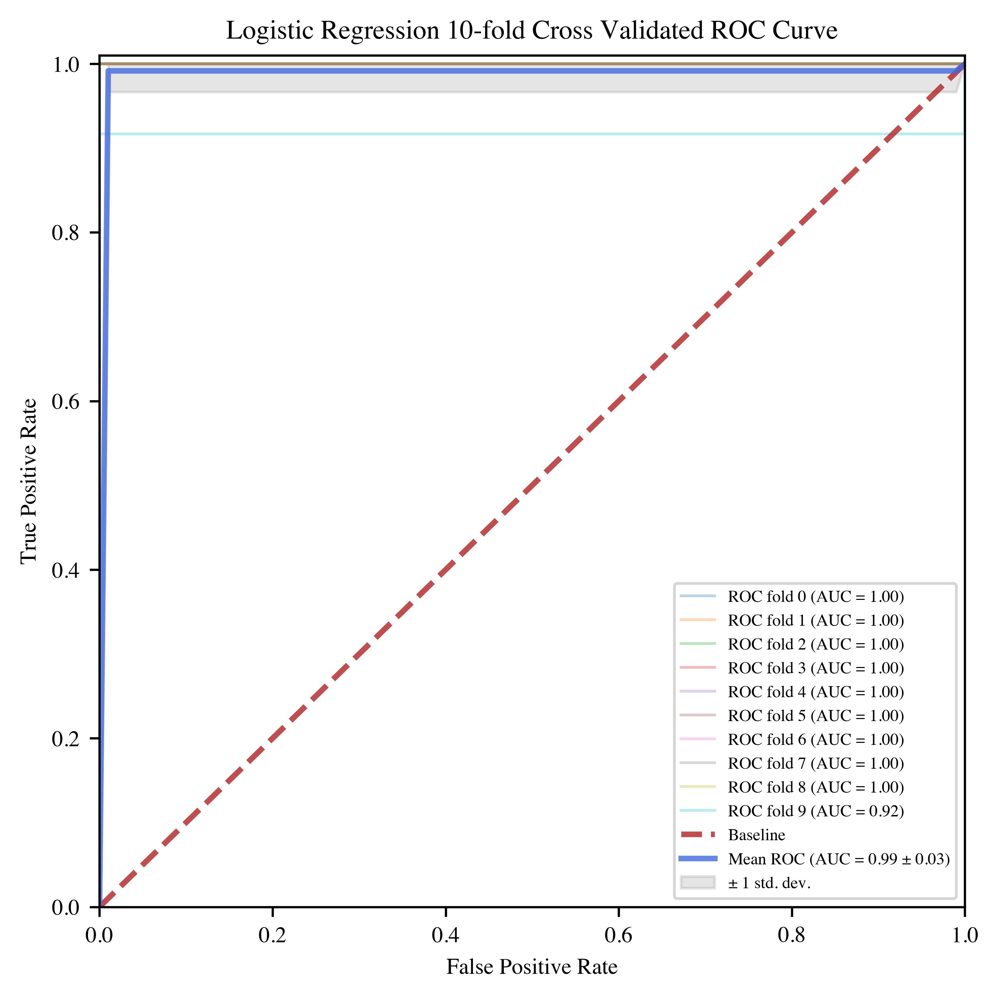

In [1464]:
draw_cv_roc_curve(LogisticRegression(C = 0.5, penalty= 'none'), 
                  cv=StratifiedKFold(n_splits=10, random_state=10), 
                  X=X, 
                  y=pd.DataFrame([1 if x == "Healthy" else 0 for x in y]), 
                  title='Logistic Regression 10-fold Cross Validated ROC Curve')

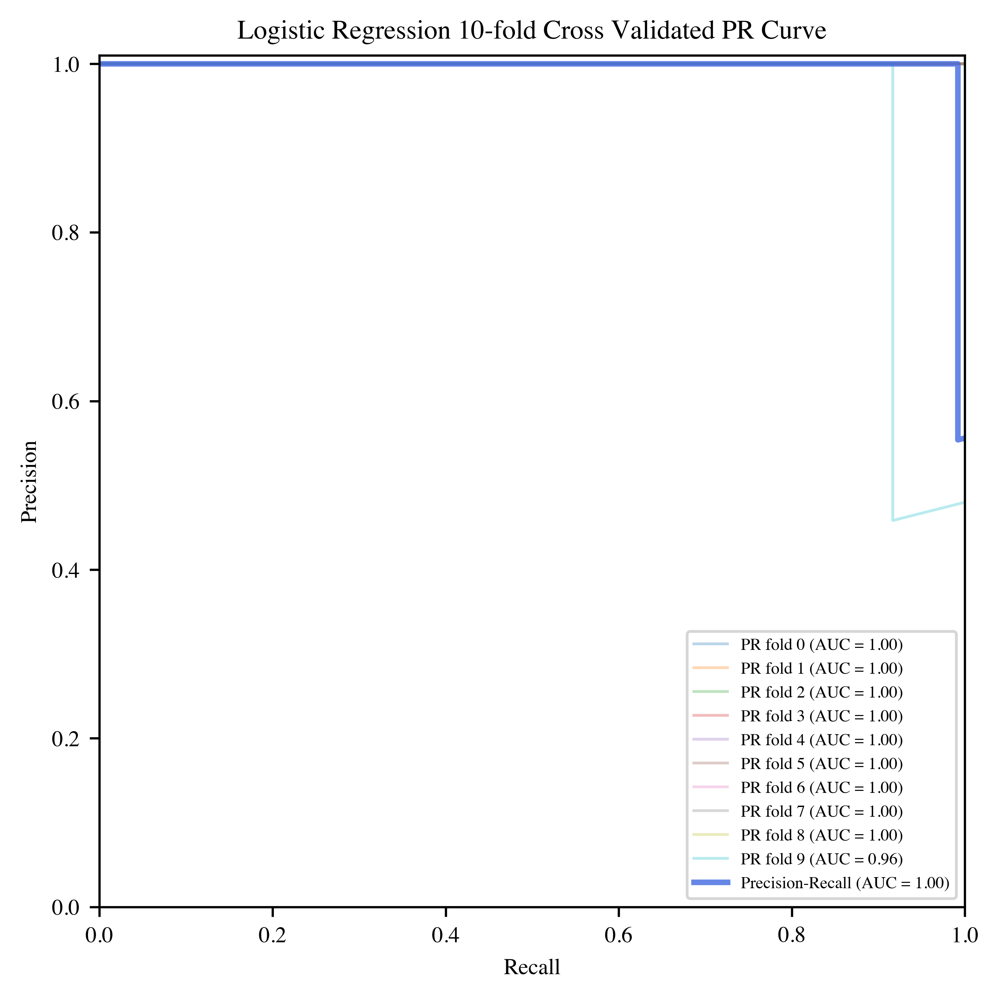

In [1419]:
draw_cv_pr_curve(LogisticRegression(C = 0.5, penalty= 'none'), 
                  cv=StratifiedKFold(n_splits=10, random_state=10), 
                  X=X, 
                  y=pd.DataFrame([1 if x == "Healthy" else 0 for x in y]), 
                  title='Logistic Regression 10-fold Cross Validated PR Curve')

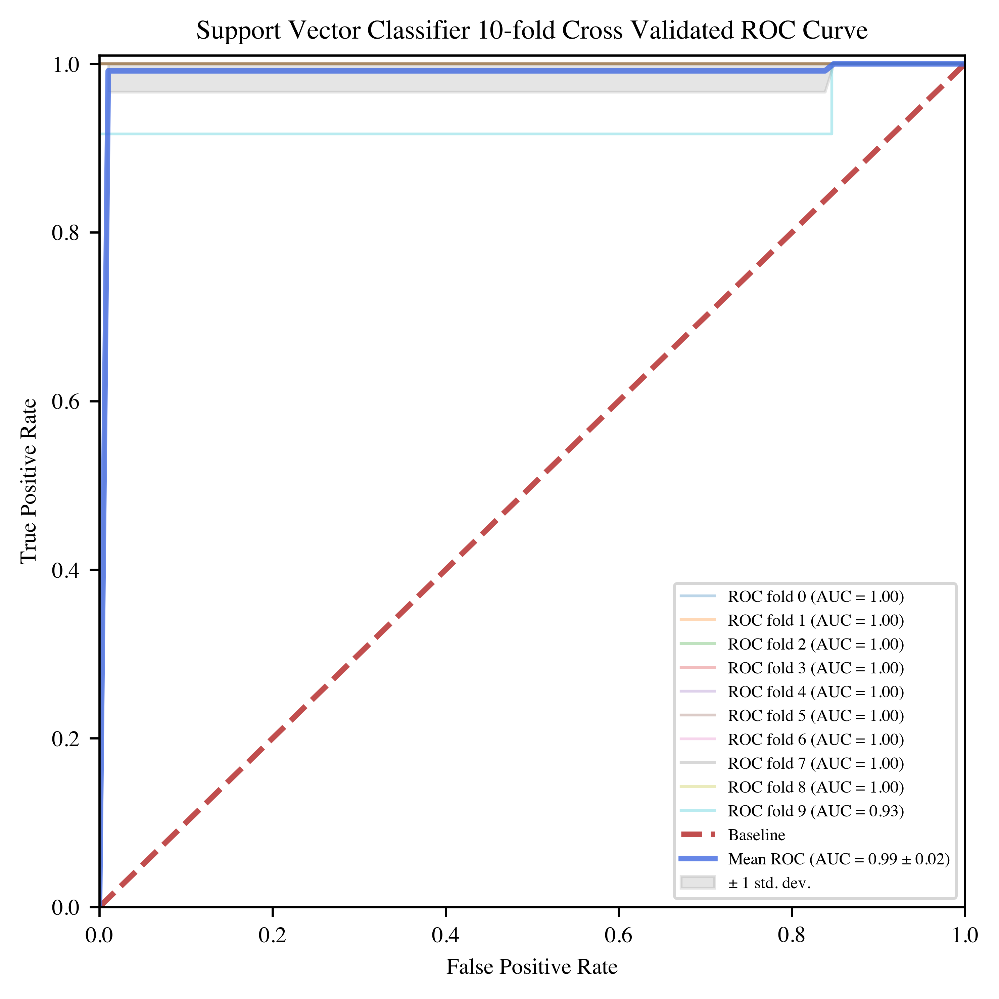

In [1420]:
draw_cv_roc_curve(SVC(C= 1.5, degree= 1, kernel= 'linear', probability=True), 
                  cv=StratifiedKFold(n_splits=10, random_state=10), 
                  X=X, 
                  y=pd.DataFrame([1 if x == "Healthy" else 0 for x in y]), 
                  title='Support Vector Classifier 10-fold Cross Validated ROC Curve')

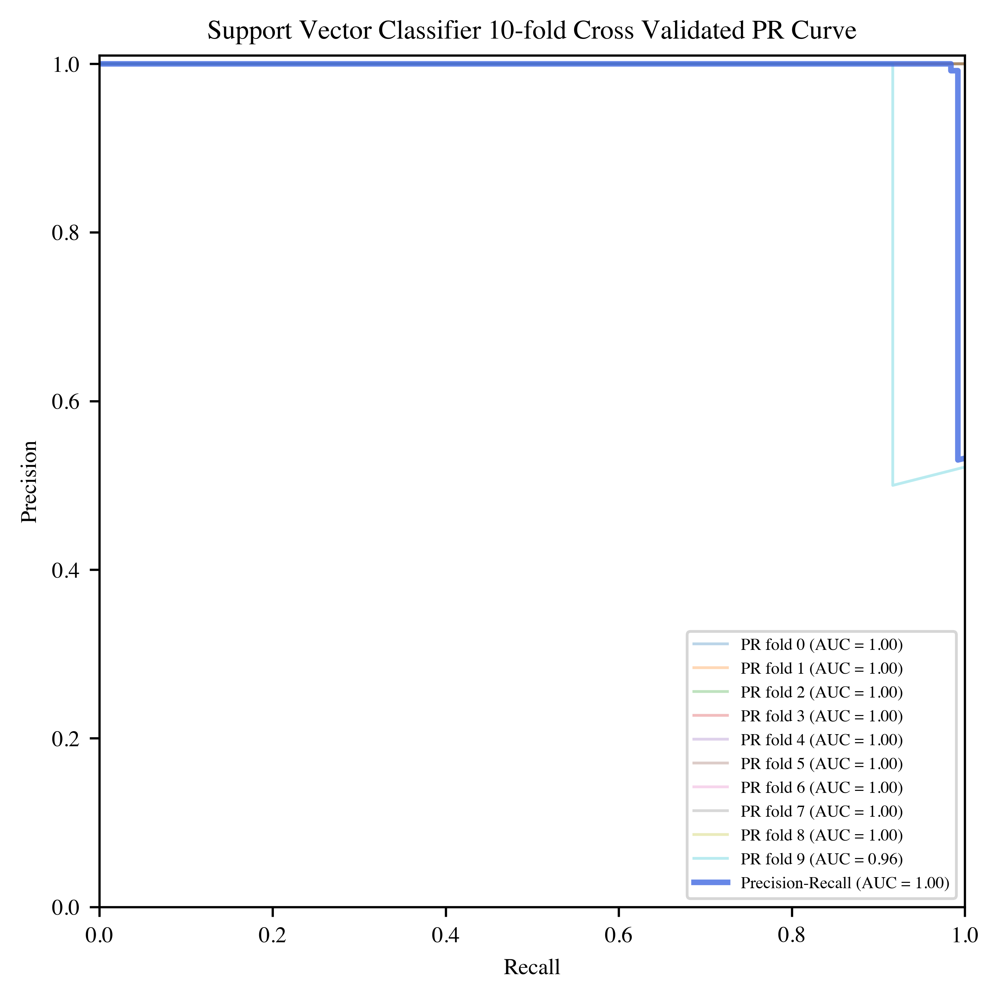

In [1421]:
draw_cv_pr_curve(SVC(C= 1.5, degree= 1, kernel= 'linear', probability=True), 
                  cv=StratifiedKFold(n_splits=10, random_state=10), 
                  X=X, 
                  y=pd.DataFrame([1 if x == "Healthy" else 0 for x in y]), 
                  title='Support Vector Classifier 10-fold Cross Validated PR Curve')

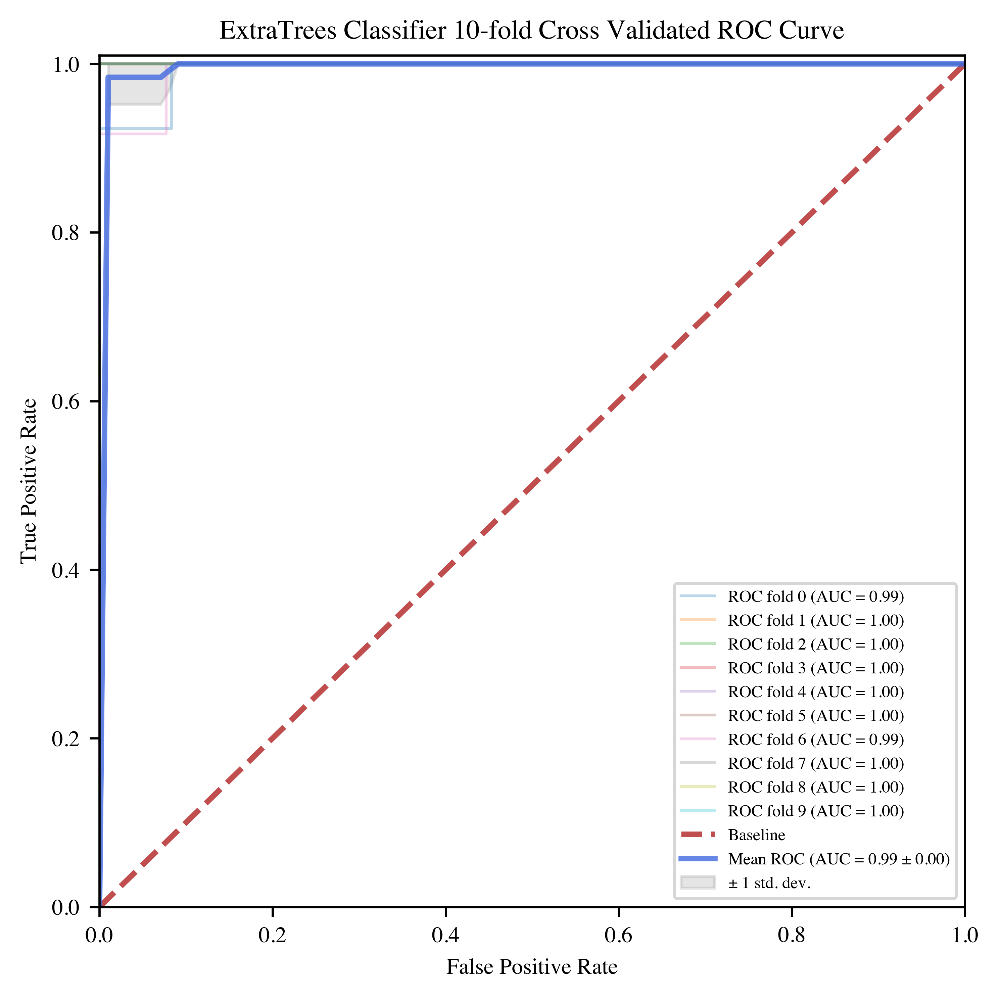

In [1440]:
draw_cv_roc_curve(ExtraTreesClassifier(criterion= 'gini', max_depth= 5, min_samples_leaf= 10, min_samples_split= 10, n_estimators= 200), 
                  cv=StratifiedKFold(n_splits=10, random_state=10), 
                  X=X, 
                  y=pd.DataFrame([1 if x == "Healthy" else 0 for x in y]), 
                  title='ExtraTrees Classifier 10-fold Cross Validated ROC Curve')

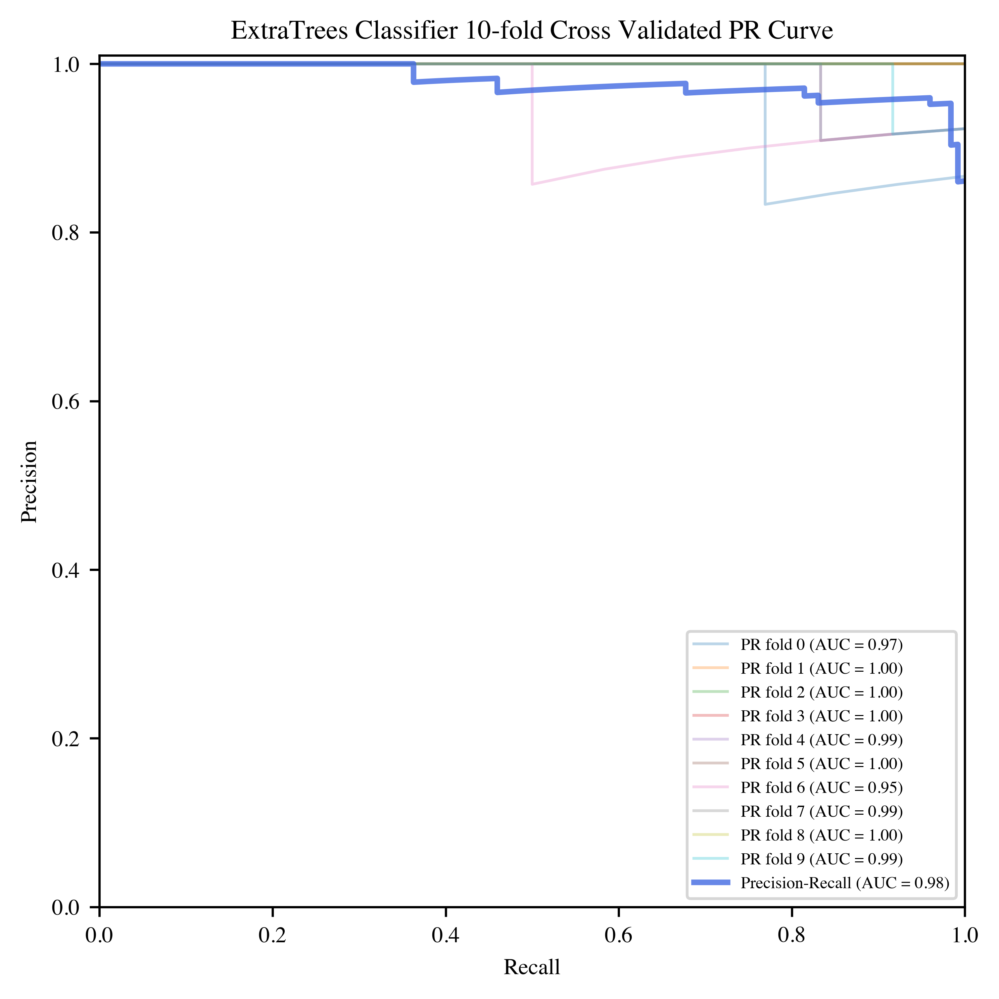

In [1435]:
draw_cv_pr_curve(ExtraTreesClassifier(criterion= 'gini', max_depth= 5, min_samples_leaf= 50, min_samples_split= 10, n_estimators= 200), 
                  cv=StratifiedKFold(n_splits=10, random_state=10), 
                  X=X, 
                  y=pd.DataFrame([1 if x == "Healthy" else 0 for x in y]), 
                  title='ExtraTrees Classifier 10-fold Cross Validated PR Curve')

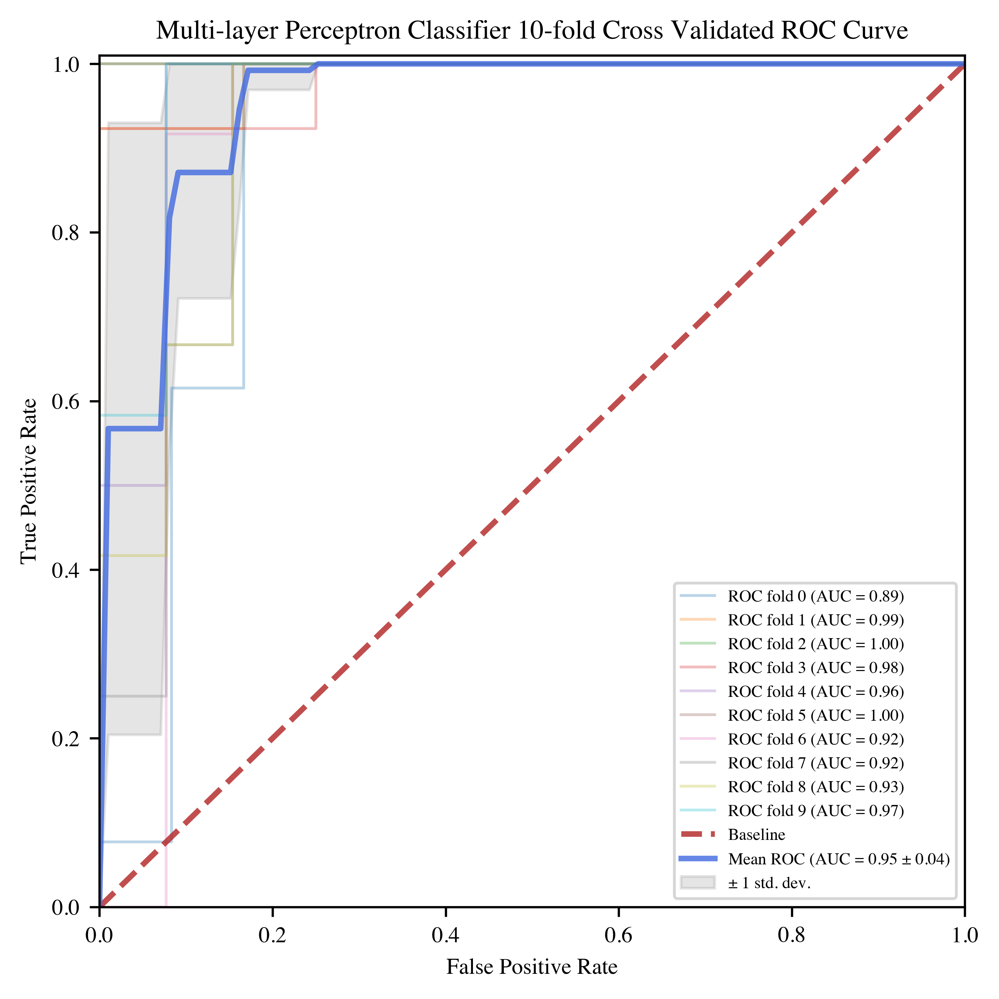

In [1436]:
draw_cv_roc_curve(MLPClassifier(activation= 'tanh', alpha= 0.005, hidden_layer_sizes= (50, 100, 50), learning_rate= 'constant', solver= 'adam', early_stopping=True), 
                  cv=StratifiedKFold(n_splits=10, random_state=11), 
                  X=X, 
                  y=pd.DataFrame([1 if x == "Healthy" else 0 for x in y]), 
                  title='Multi-layer Perceptron Classifier 10-fold Cross Validated ROC Curve')

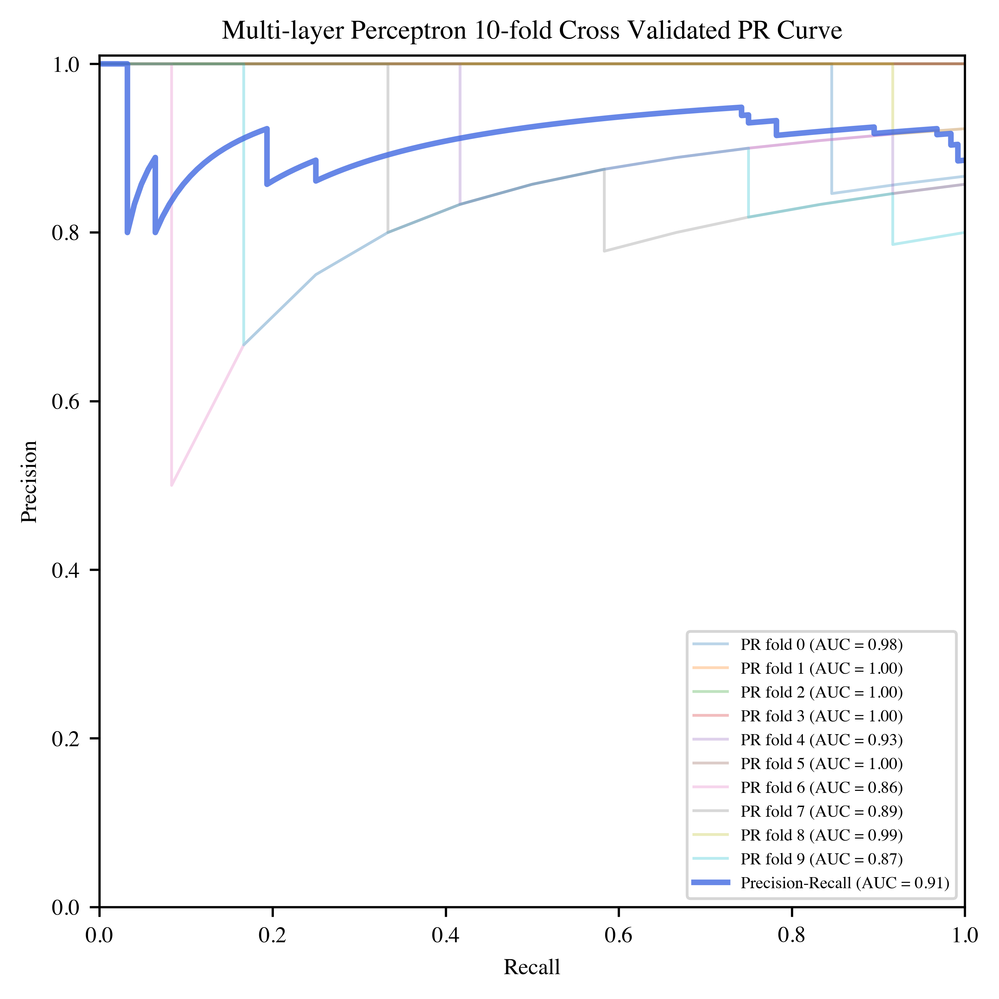

In [1437]:
draw_cv_pr_curve(MLPClassifier(activation= 'tanh', alpha= 0.005, hidden_layer_sizes= (50, 100, 50), learning_rate= 'constant', solver= 'adam', early_stopping=True), 
                  cv=StratifiedKFold(n_splits=10, random_state=11), 
                  X=X, 
                  y=pd.DataFrame([1 if x == "Healthy" else 0 for x in y]), 
                  title='Multi-layer Perceptron 10-fold Cross Validated PR Curve')

# Decision Border

In [1452]:
def decision_border(select_spectra, y, title, classifier):
    
    y_decision = np.array([0 if label == "Healthy" else 1 for label in spectra.loc[X_decision.index, "diagnostic"]])

    scaled = StandardScaler().fit_transform(select_spectra)
    pca = PCA(n_components=2)
    components = pca.fit_transform(scaled)

    clf = classifier.fit(components, y_decision)

    xx, yy = np.mgrid[components[:, 0].min()-1:components[:, 0].max()+1:.01, components[:, 1].min()-1:components[:, 1].max()+1:.01]
    grid = np.c_[xx.ravel(), yy.ravel()]
    probs = clf.predict_proba(grid)[:, 1].reshape(xx.shape)

    f, ax = plt.subplots(figsize=(6,5))
    contour = ax.contourf(xx, yy, probs, 25, cmap="RdBu",
                          vmin=0, vmax=1)
    ax_c = f.colorbar(contour)
    ax_c.set_label("$P(y = Positive Patient Infection)$")
    ax_c.set_ticks([0, .25, .5, .75, 1])

    healthy = ax.scatter(components[:124,0], components[:124, 1], c=y_decision[:124], s=20,
               cmap="RdBu", vmin=-.2, vmax=1.2,
               edgecolor="white", linewidth=0.5, label = "Healthy")
    covid = ax.scatter(components[124:,0], components[124:, 1], c=y_decision[124:], s=20,
               cmap="RdBu", vmin=-.2, vmax=1.2,
               edgecolor="white", linewidth=0.5, label = "COVID-19")
        
    ax.set(xlabel="Principal Component 1", ylabel="Principal Component 2", xlim=(components[:, 0].min()-1,components[:, 0].max()+1), ylim=(components[:, 1].min()-1,components[:, 1].max()+1))
   
    leg = ax.legend()
    leg.legendHandles[0].set_color('firebrick')
    leg.legendHandles[1].set_color('royalblue')
    plt.title(title)
    plt.tight_layout()
    plt.rcParams.update({'mathtext.default':  'regular' })
    plt.rcParams['font.size'] = 8
    plt.rcParams["font.family"] = "serif"
    plt.rcParams["font.serif"] = "Times"
    plt.rcParams["figure.dpi"] = 600
    plt.show()

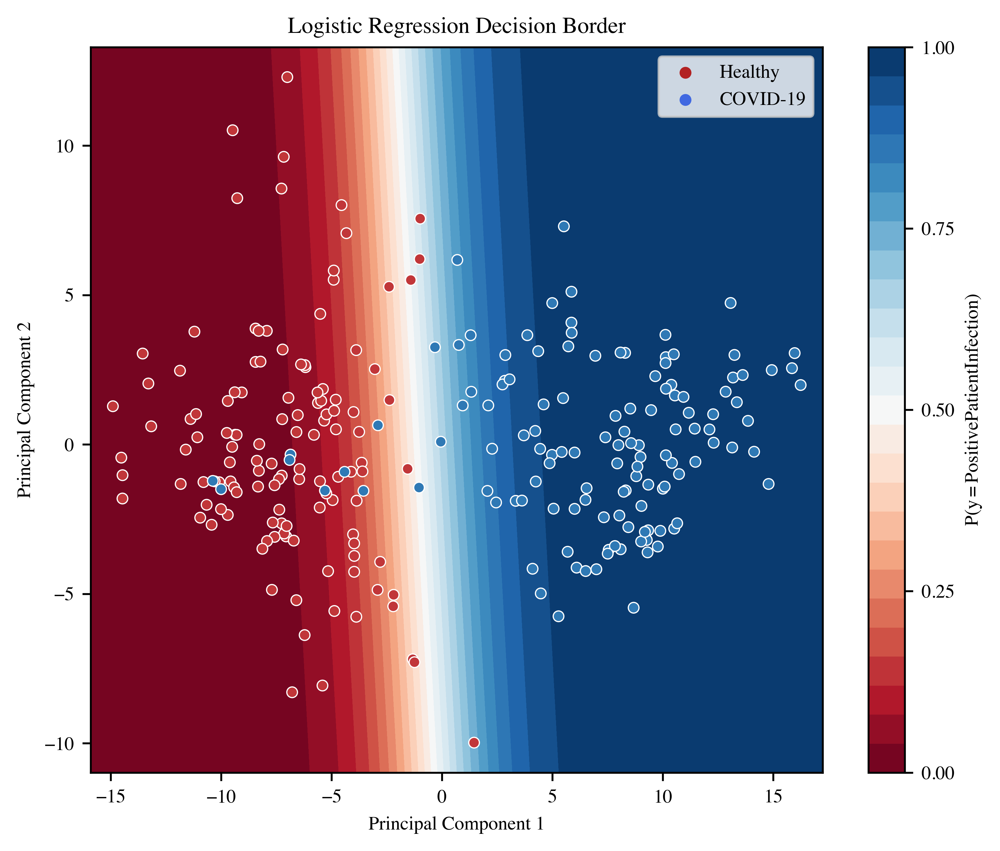

In [1453]:
decision_border(select_spectra, 
                y,
                title="Logistic Regression Decision Border",
                classifier = LogisticRegression(C = 0.5, penalty= 'none'))

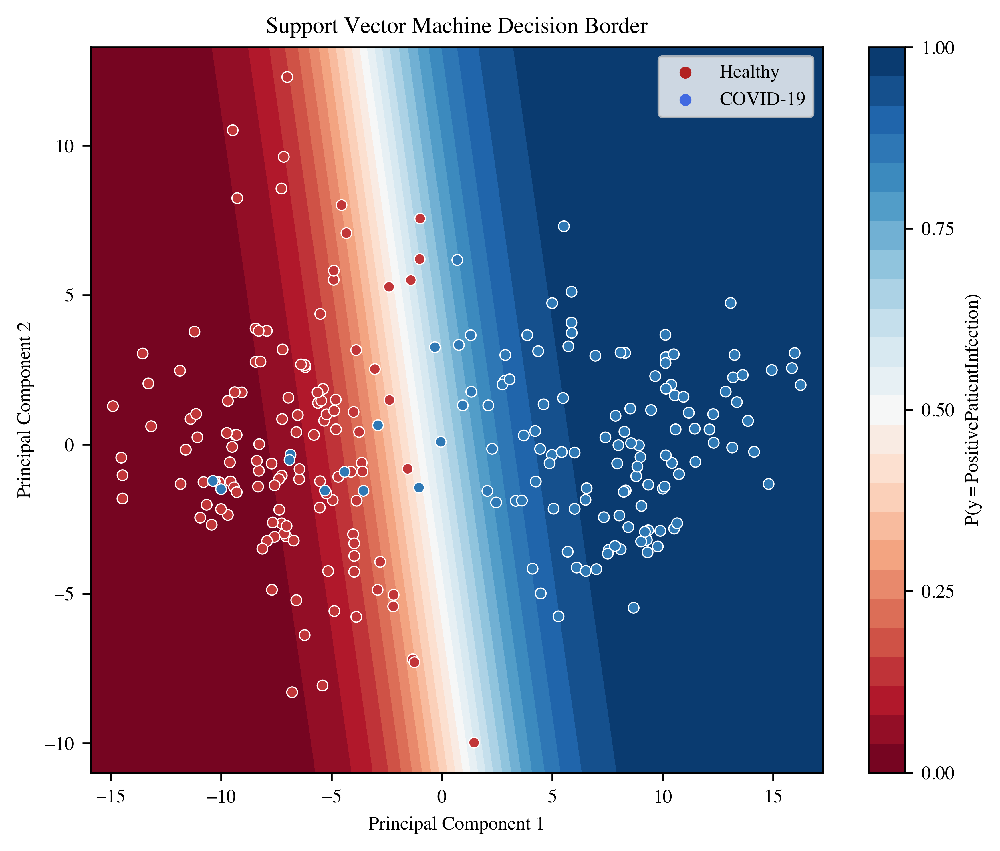

In [1457]:
decision_border(select_spectra, 
                y, 
                title="Support Vector Machine Decision Border",
                classifier = SVC(C= 1.5, degree= 1, kernel= 'linear', probability=True))

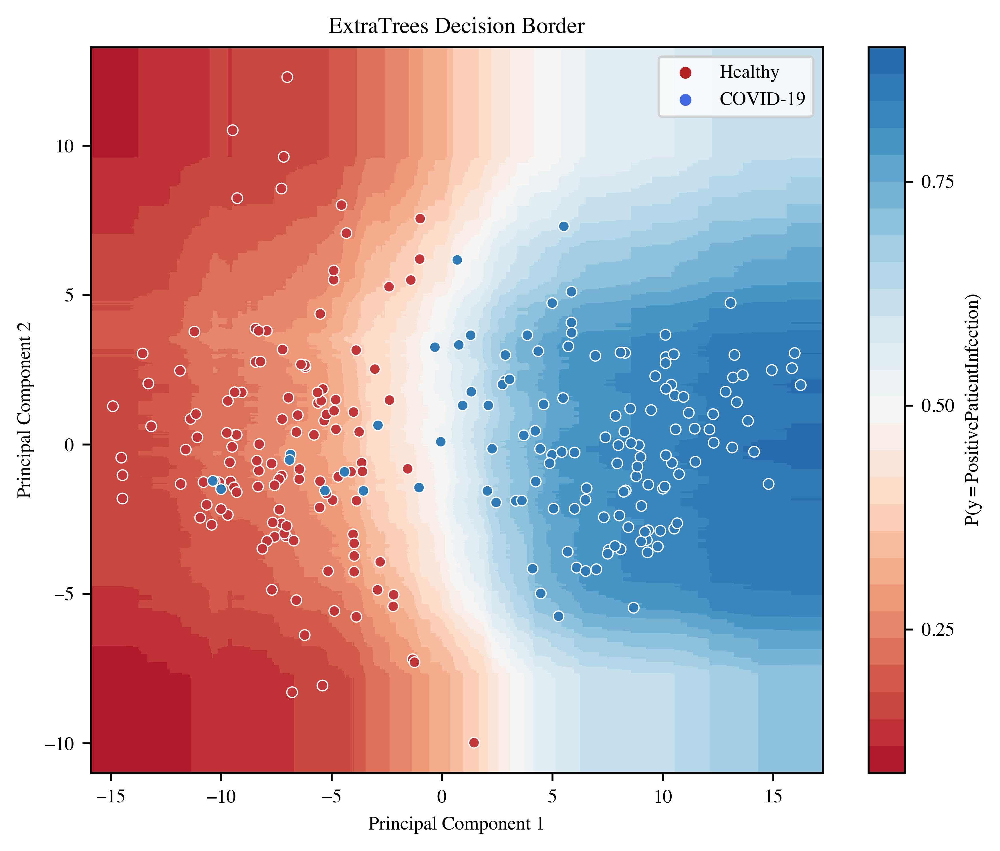

In [1456]:
decision_border(select_spectra, 
                y, 
                title="ExtraTrees Decision Border",
                classifier = ExtraTreesClassifier(criterion= 'gini', max_depth= 5, min_samples_leaf= 3, min_samples_split= 10, n_estimators= 200))

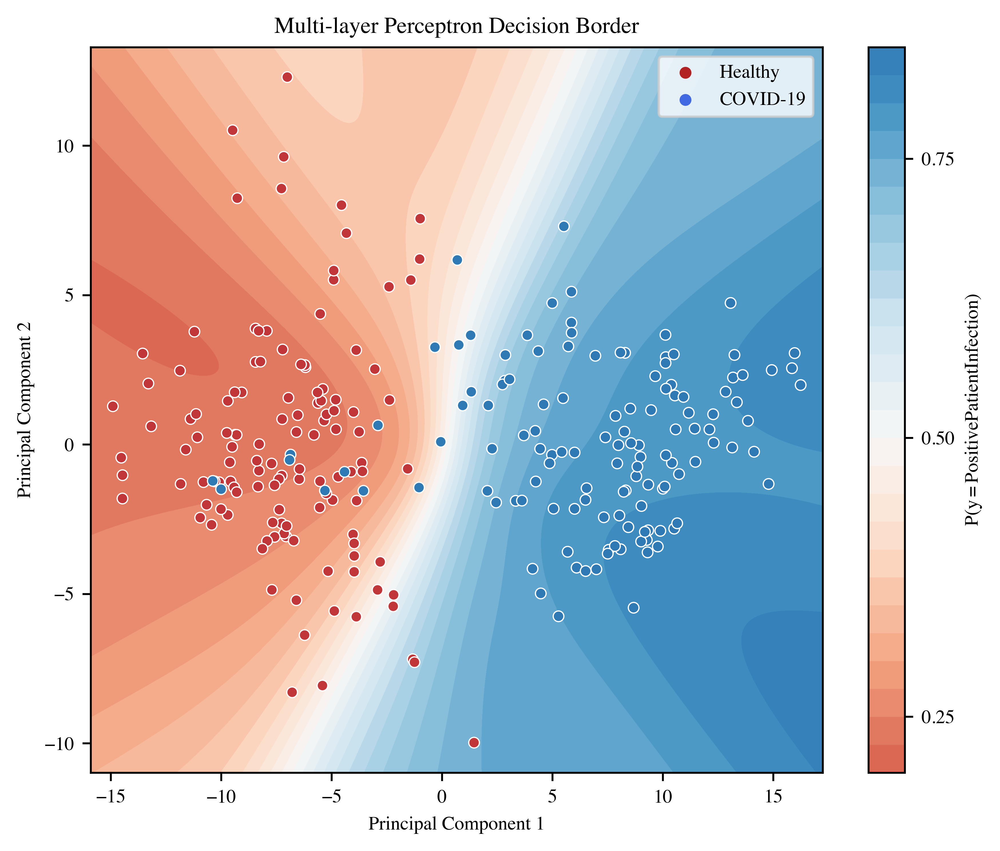

In [1458]:
decision_border(select_spectra, 
                y, 
                title="Multi-layer Perceptron Decision Border",
                classifier = MLPClassifier(activation= 'tanh', alpha= 0.005, hidden_layer_sizes= (50, 100, 50), learning_rate= 'constant', solver= 'adam', early_stopping=True))

# Subsemble Classifier

In [51]:
def build_subsemble(meta, proba, predict_proba):
    """Build a subsemble with random partitions"""
    sub = Subsemble(partitions=2, folds=2)
    sub.add([KNeighborsClassifier(n_neighbors= 2, weights= 'distance'), 
             LogisticRegression(C = 0.5, penalty = 'none'),
             SVC(C= 1.5, degree= 1, kernel= 'linear', probability=True), 
             DecisionTreeClassifier(criterion= 'entropy', min_samples_leaf= 1, min_samples_split= 3, random_state=10),
             AdaBoostClassifier(learning_rate= 1, n_estimators= 50), 
             GradientBoostingClassifier(learning_rate= 0.1, n_estimators= 50),
             RandomForestClassifier(criterion= 'gini', max_depth= 5, min_samples_leaf= 3, min_samples_split= 20, n_estimators= 150, random_state=10),
             MLPClassifier(activation= 'tanh', alpha= 0.05, hidden_layer_sizes= (50, 100, 50), learning_rate= 'constant', solver= 'adam'),
             ExtraTreesClassifier(criterion= 'gini', max_depth= 5, min_samples_leaf= 3, min_samples_split= 10, n_estimators= 200, random_state=10),
            ],
           proba=proba)
    sub.add_meta(meta)
    return sub


# Meta Learner Model Grid Search

In [969]:
for i in [KNeighborsClassifier(n_neighbors= 2, weights= 'distance'), 
             LogisticRegression(C = 0.5, penalty = 'none'),
             SVC(C= 1.5, degree= 1, kernel= 'linear', probability=True), 
             DecisionTreeClassifier(criterion= 'entropy', min_samples_leaf= 1, min_samples_split= 3, random_state=10),
             AdaBoostClassifier(learning_rate= 1, n_estimators= 50), 
             GradientBoostingClassifier(learning_rate= 0.1, n_estimators= 50),
             RandomForestClassifier(criterion= 'gini', max_depth= 5, min_samples_leaf= 3, min_samples_split= 20, n_estimators= 150, random_state=10), 
             ExtraTreesClassifier(criterion= 'gini', max_depth= 5, min_samples_leaf= 3, min_samples_split= 10, n_estimators= 200, random_state=10)]:
    
    sub = build_subsemble(meta = i)
    print(np.mean(cross_val_score(sub, X.values, np.array([0 if label == "Healthy" else 1 for label in y]),cv=StratifiedKFold(n_splits=10),  n_jobs=1, scoring="accuracy")))

0.9639999999999999
0.9720000000000001
0.968
0.9559999999999998
0.9719999999999999
0.952
0.968
0.9760000000000002


# Probabilistic Model Grid Search

In [1012]:
sub = build_subsemble(proba = True, meta=MLPClassifier(activation= 'relu', alpha= 0.01, hidden_layer_sizes= (200, 100, 30), learning_rate= 'adaptive', solver= 'sgd'))
score = cross_val_score(sub, X.values, np.array([0 if label == "Healthy" else 1 for label in y]),cv=StratifiedKFold(n_splits=10, random_state=10),  n_jobs=1, scoring="accuracy")
print(score)
print(np.mean(score))

[1.   0.92 1.   0.96 1.   0.96 1.   0.96 1.   0.96]
0.9760000000000002


In [1013]:
sub = build_subsemble(proba = False, meta=MLPClassifier(activation= 'relu', alpha= 0.01, hidden_layer_sizes= (200, 100, 30), learning_rate= 'adaptive', solver= 'sgd'))
score = cross_val_score(sub, X.values, np.array([0 if label == "Healthy" else 1 for label in y]),cv=StratifiedKFold(n_splits=10, random_state=10),  n_jobs=1, scoring="accuracy")
print(score)
print(np.mean(score))

[1.   0.92 1.   0.92 0.96 0.96 0.96 0.96 1.   0.96]
0.9640000000000001


# Final Subsemble Classifier Model Accuracy Performance

In [52]:
sub = build_subsemble(proba = True, predict_proba = True, meta=MLPClassifier(activation= 'relu', alpha= 0.01, hidden_layer_sizes= (50, 30, 10), learning_rate= 'adaptive', solver= 'sgd'))
score = cross_val_score(sub, X.values, np.array([0 if label == "Healthy" else 1 for label in y]),cv=StratifiedKFold(n_splits=10, random_state=10),  n_jobs=1, scoring="accuracy")
print(score)
print(np.mean(score))

[0.96 0.96 1.   1.   1.   1.   1.   0.96 1.   0.96]
0.984


# Final Subsemble Classifier Metrics

In [53]:
def subsemble_metrics(clf):
    matthews = make_scorer(matthews_corrcoef, greater_is_better=True)
    cohen = make_scorer(cohen_kappa_score, greater_is_better=True)
    alt_score = {'matthews': matthews, 'cohen': cohen,
                'accuracy': 'accuracy', 'precision':'precision',
                'recall': 'recall', 'f1': 'f1', 'roc_auc': 'roc_auc'} 
    subsemble_metrics_df = pd.DataFrame(columns=alt_score.keys())
    for metric in alt_score.keys():
        try:
            scores = cross_val_score(sub, X.values, np.array([0 if label == "Healthy" else 1 for label in y]), cv=StratifiedKFold(n_splits=10, random_state=10), scoring=alt_score[metric], verbose=1)
            subsemble_metrics_df[metric] = scores
        except:
            pass
    return subsemble_metrics_df

In [54]:
subsemble_metrics = subsemble_metrics(clf = sub)
#roc_auc score is nan since the meta MLPclassifier has no proba function 
del subsemble_metrics['roc_auc']
subsemble_metrics


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  1.3min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


,matthews,cohen,accuracy,precision,recall,f1
0,0.849837,0.919614,0.92,1.000000,0.833333,0.956522
1,0.923077,0.920128,0.96,0.923077,1.000000,0.960000
2,1.000000,1.000000,1.00,1.000000,1.000000,1.000000
3,1.000000,1.000000,1.00,1.000000,1.000000,1.000000
4,1.000000,1.000000,0.96,1.000000,1.000000,1.000000
5,1.000000,1.000000,1.00,1.000000,1.000000,1.000000
6,0.923077,0.920128,1.00,1.000000,1.000000,0.960000
7,0.923077,0.920128,0.96,1.000000,0.923077,0.960000
8,1.000000,1.000000,1.00,1.000000,1.000000,1.000000
9,0.922600,0.919614,0.96,0.928571,1.000000,0.962963


In [55]:
subsemble_time = cross_validate(sub, X.values, np.array([0 if label == "Healthy" else 1 for label in y]), cv=StratifiedKFold(n_splits=10, random_state=10), scoring="accuracy", verbose=2)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV]  ................................................................
[CV] ................................................. , total=   8.2s
[CV]  ................................................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    8.2s remaining:    0.0s


[CV] ................................................. , total=   8.0s
[CV]  ................................................................
[CV] ................................................. , total=   8.0s
[CV]  ................................................................
[CV] ................................................. , total=   8.1s
[CV]  ................................................................
[CV] ................................................. , total=   8.0s
[CV]  ................................................................
[CV] ................................................. , total=   8.2s
[CV]  ................................................................
[CV] ................................................. , total=   8.0s
[CV]  ................................................................
[CV] ................................................. , total=   8.1s
[CV]  ................................................................
[CV] .

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:  1.3min finished


In [56]:
subsemble_metrics['time'] = subsemble_time['fit_time'] + subsemble_time['score_time']

In [57]:
subsemble_metrics

,matthews,cohen,accuracy,precision,recall,f1,time
0,0.849837,0.919614,0.92,1.000000,0.833333,0.956522,8.183379
1,0.923077,0.920128,0.96,0.923077,1.000000,0.960000,8.043465
2,1.000000,1.000000,1.00,1.000000,1.000000,1.000000,7.967663
3,1.000000,1.000000,1.00,1.000000,1.000000,1.000000,8.060365
4,1.000000,1.000000,0.96,1.000000,1.000000,1.000000,7.982336
5,1.000000,1.000000,1.00,1.000000,1.000000,1.000000,8.238439
6,0.923077,0.920128,1.00,1.000000,1.000000,0.960000,8.032432
7,0.923077,0.920128,0.96,1.000000,0.923077,0.960000,8.065152
8,1.000000,1.000000,1.00,1.000000,1.000000,1.000000,8.058417
9,0.922600,0.919614,0.96,0.928571,1.000000,0.962963,7.912917


In [58]:
subsemble_metrics_mean = pd.DataFrame(subsemble_metrics.mean(axis=0))
subsemble_metrics_mean['test'] = ["Matthew's Coefficient", "Cohen's Kappa", "Accuracy", "Precision", "Recall", "F1-Score", "Time"]
subsemble_metrics_mean.reset_index(inplace=True, drop=True)
subsemble_metrics_mean = subsemble_metrics_mean.iloc[:6, :]

In [59]:
subsemble_metrics_mean

,0,test
0,0.954167,Matthew's Coefficient
1,0.959961,Cohen's Kappa
2,0.976000,Accuracy
3,0.985165,Precision
4,0.975641,Recall
5,0.979948,F1-Score


In [60]:
subsemble_metrics.iloc[0, :6]

matthews     0.849837
cohen        0.919614
accuracy     0.920000
precision    1.000000
recall       0.833333
f1           0.956522
Name: 0, dtype: float64

In [61]:
fig = go.Figure()
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[0, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'markers',
        name = 'Fold 1',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[1, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'markers',
        name = 'Fold 2',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[2, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'markers',
        name = 'Fold 3',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[3, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'markers',
        name = 'Fold 4',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[4, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'markers',
        name = 'Fold 5',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[5, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'markers',
        name = 'Fold 6',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[6, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'markers',
        name = 'Fold 7',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[7, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'markers',
        name = 'Fold 8',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[8, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'markers',
        name = 'Fold 9',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[9, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'markers',
        name = 'Fold 10',
    ))
fig.update_layout(
    title = 'Mic Patterns',
    showlegend = True
)
fig.update_traces(mode="markers", marker=dict(line_color='white', opacity=0.5))

fig.show()

In [62]:
fig = go.Figure()
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[0, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'lines',
        name = 'Fold 1',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[1, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'lines',
        name = 'Fold 2',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[2, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'lines',
        name = 'Fold 3',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[3, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'lines',
        name = 'Fold 4',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[4, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'lines',
        name = 'Fold 5',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[5, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'lines',
        name = 'Fold 6',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[6, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'lines',
        name = 'Fold 7',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[7, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'lines',
        name = 'Fold 8',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[8, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'lines',
        name = 'Fold 9',
    ))
fig.add_trace(go.Scatterpolar(
        r = subsemble_metrics.iloc[9, :6],
        theta = subsemble_metrics.iloc[0, :6].index,
        mode = 'lines',
        name = 'Fold 10',
    ))
fig.update_layout(
    title = 'Mic Patterns',
    showlegend = True
)
fig.update_traces(mode='lines', marker=dict(line_color='white', opacity=0.5))

fig.show()

In [97]:
radar_df = subsemble_metrics.iloc[:, :-1]
radar_df.columns = ["Matthew's Coefficient", "Cohen's Kappa", "Accuracy", "Precision", "Recall", "F1-Score"]
radar_df = radar_df.stack().reset_index()
radar_df.columns = ["Fold", "Metric", "Score"]
fig = px.line_polar(radar_df, r="Score", theta="Metric", color="Fold", line_close=True,
                    color_discrete_sequence=px.colors.qualitative.Bold,
                    template="plotly_white")
fig.update_layout(
    autosize=False,
    width=1000,
    height=1000)
fig.update_layout(legend=dict(
    yanchor="top",
    y=0.7,
    xanchor="left",
    x=1.2
))

fig.update_polars(angularaxis_tickfont_size=20)
fig.update_layout(legend = dict(font = dict(family = "Times", size = 20, color = "black")),
                  legend_title = dict(font = dict(family = "Times", size = 20, color = "black")))

fig.show()

In [64]:
fig = px.line_polar(subsemble_metrics_mean, r=0, theta='test', line_close=True)

fig.update_traces(fill='toself')
fig.update_polars(sector=[-180,180])
fig.update_layout(
    autosize=False,
    width=800,
    height=800)


fig.show()

In [1571]:
subsemble_boxplot_df = pd.DataFrame(columns = ['metric', 'score'])
subsemble_boxplot_df['score'] = subsemble_metrics.T.values.reshape(1,70)[0][:60]
subsemble_boxplot_df['metric'] = list(itertools.chain.from_iterable(itertools.repeat(x, 10) for x in ["Matthew's Coefficient", "Cohen's Kappa", "Accuracy", "Precision", "Recall", "F1-Score"]))


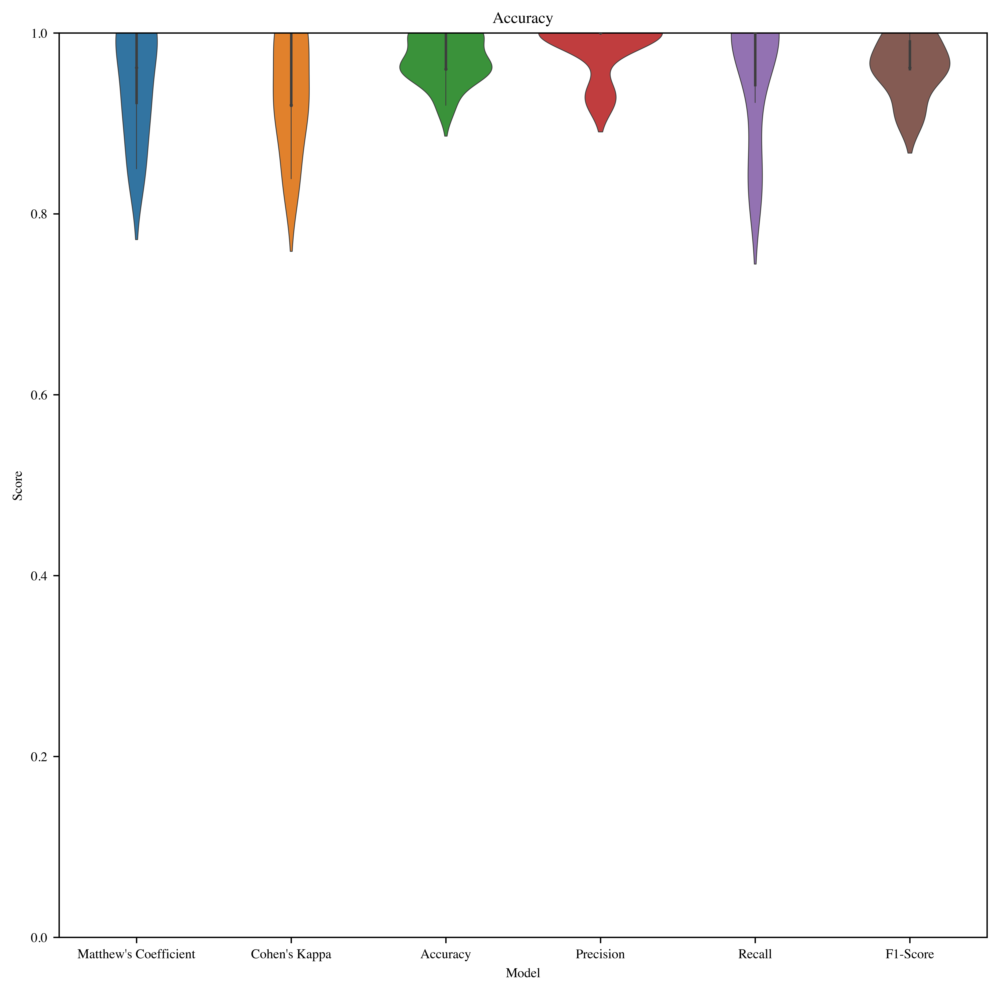

In [1575]:
plt.figure(0, figsize=(10,10))

ax = sns.violinplot(x="metric", y="score", data=subsemble_boxplot_df, linewidth=0.5,zorder=0)
ax.set_title("Accuracy")
ax.set_xlabel("Model")
ax.set_ylabel("Score")
ax.set_ylim(0, 1)

plt.rcParams.update({'mathtext.default':  'regular' })
plt.rcParams['font.size'] = 8
plt.rcParams["font.family"] = "serif"
plt.rcParams["font.serif"] = "Times"
plt.rcParams["figure.dpi"] = 600

# Benchmark Subsemble Model for Optimization of Pre-processing Workflow

In [1195]:
select_benchmark = features_benchmark(model=sub, spectra=spectra, n_features=200)
select_benchmark

,10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190
0,0.48,0.48,0.56,0.60,0.36,0.36,0.64,0.52,0.60,0.48,0.44,0.40,0.68,0.56,0.52,0.48,0.48,0.48,0.64
1,0.44,0.52,0.36,0.64,0.48,0.40,0.40,0.32,0.72,0.52,0.32,0.68,0.60,0.52,0.56,0.20,0.44,0.60,0.68
2,0.40,0.36,0.72,0.52,0.36,0.52,0.48,0.40,0.60,0.48,0.40,0.36,0.52,0.48,0.52,0.60,0.56,0.32,0.48
3,0.44,0.40,0.36,0.56,0.44,0.44,0.44,0.48,0.40,0.56,0.40,0.44,0.68,0.52,0.52,0.60,0.56,0.44,0.48
4,0.52,0.44,0.60,0.40,0.32,0.40,0.32,0.40,0.64,0.44,0.56,0.48,0.68,0.68,0.48,0.56,0.64,0.48,0.44
5,0.56,0.40,0.44,0.44,0.52,0.40,0.72,0.56,0.48,0.52,0.60,0.56,0.60,0.64,0.32,0.44,0.60,0.44,0.24
6,0.52,0.48,0.36,0.44,0.24,0.48,0.48,0.40,0.52,0.52,0.48,0.28,0.28,0.60,0.64,0.56,0.60,0.56,0.24
7,0.52,0.44,0.48,0.48,0.48,0.56,0.52,0.32,0.44,0.48,0.52,0.48,0.52,0.64,0.32,0.36,0.60,0.52,0.52
8,0.48,0.56,0.36,0.52,0.36,0.44,0.32,0.52,0.56,0.44,0.52,0.48,0.44,0.52,0.44,0.36,0.52,0.52,0.48
9,0.56,0.52,0.52,0.60,0.60,0.52,0.48,0.64,0.44,0.48,0.60,0.56,0.68,0.44,0.48,0.44,0.48,0.52,0.60


In [1176]:
scaling_benchmark = scale_benchmark(model=sub, spectra=spectra, scaler_dict = scaler_dict)
scaling_benchmark

,none,sc,sub,minmax,maxabs
0,0.60,0.52,0.44,0.44,0.56
1,0.52,0.28,0.56,0.56,0.48
2,0.52,0.44,0.52,0.48,0.44
3,0.56,0.56,0.36,0.52,0.56
4,0.52,0.44,0.44,0.48,0.52
5,0.40,0.40,0.56,0.52,0.40
6,0.68,0.56,0.48,0.56,0.64
7,0.36,0.52,0.52,0.48,0.52
8,0.52,0.44,0.44,0.52,0.52
9,0.52,0.52,0.44,0.44,0.44


In [1163]:
var_benchmark = variance_benchmark(model=sub, spectra=spectra, explained_variance=99)
var_benchmark

,90,91,92,93,94,95,96,97,98
0,0.56,0.44,0.52,0.56,0.56,0.76,0.48,0.52,0.56
1,0.52,0.64,0.64,0.48,0.44,0.40,0.40,0.48,0.44
2,0.48,0.52,0.44,0.52,0.52,0.52,0.44,0.40,0.60
3,0.48,0.40,0.56,0.48,0.52,0.48,0.72,0.52,0.36
4,0.52,0.72,0.48,0.64,0.60,0.44,0.40,0.48,0.60
5,0.48,0.40,0.56,0.48,0.60,0.52,0.64,0.60,0.44
6,0.36,0.44,0.56,0.32,0.28,0.68,0.48,0.52,0.52
7,0.44,0.48,0.48,0.64,0.48,0.52,0.32,0.40,0.52
8,0.48,0.52,0.48,0.48,0.44,0.48,0.44,0.52,0.56
9,0.36,0.48,0.60,0.56,0.40,0.60,0.48,0.44,0.56


# Write Data to Files

In [1504]:
from pandas import ExcelWriter
from openpyxl import load_workbook

path = '/Users/davidchen/Documents/GitHub/Erevna/Processed_Dataset.xlsx'
book = load_workbook(path)
writer = ExcelWriter(path, engine='openpyxl') 
writer.book = book
asdf = pd.concat([X,y],axis=1)
asdf.to_excel(writer,'Processed_Dataset')
writer.save()
writer.close()